# Imports and Configurations

In [1]:
# Experiment
EXP_NUM = 3
DATASET = 'UECE'
CONTENT = 'dry/wet'
GRANULARITY = 5
TARGET_COL = 'category'
CLASS_MAP = {
    'no-rain': 'No Rain', 
    'light': 'Light', 'moderate': 'Moderate', 
    'heavy': 'Heavy', 'violent': 'Violent'
}

import pandas as pd
import sys
from pathlib import Path
import joblib
import warnings
warnings.filterwarnings('ignore')

current_path = Path.cwd()
PROJECT_ROOT = None

for p in [current_path, current_path.parent, current_path.parent.parent]:
    if (p / "rainfall_acoustic_classification").exists():
        PROJECT_ROOT = p
        break

if PROJECT_ROOT:
    if str(PROJECT_ROOT) not in sys.path:
        sys.path.insert(0, str(PROJECT_ROOT))
    print(f"Project root added to sys.path")
else:
    print("ERROR: Unable to find the project root.")

from rainfall_acoustic_classification.visualization import VisualizationEngine
from rainfall_acoustic_classification.utils import get_standard_logger

# Feature Engineering
from rainfall_acoustic_classification.feature_engineering import (
    # Core modules
    ExperimentCreator, ExperimentConfig, 
    
    # Single Metric (PSD_mean) 
    SingleSelectorConfig, build_single_selector,

    # Metrics Selection
    VectorSelectorConfig, VectorSelector,
    
    # Vizualization
    plot_correlation_heatmap, plot_individual_boxplots, plot_feature_importance, plot_fisher_scores
)

# Modeling
from rainfall_acoustic_classification.modeling import (
    # Classification
    ClassifierFactory, ClassifierConfig,

    # Hyperparameter Optimization
    ModelOptimizer,TuningConfig,

    # Validation
    ModelEvaluator, ValidationConfig,

    #Vizualization
    plot_confusion_matrix_grid, plot_multiclass_pr_curve, plot_experiment_performance_heatmap
)

# Directories
DATA_DIR = PROJECT_ROOT / "data" / "processed" / DATASET
REPORTS_DIR = PROJECT_ROOT / "reports" / "vector_selector" / "experiment_3" / DATASET
MODELS_DIR = PROJECT_ROOT / "models" / "vector_selector" / "experiment_3" / DATASET

REPORTS_DIR.mkdir(parents=True, exist_ok=True)
MODELS_DIR.mkdir(parents=True, exist_ok=True)

Project root added to sys.path


# Data Loading and Mapping

In [2]:
df_train_metrics = pd.read_csv(DATA_DIR /  f"{DATASET}_train_metrics.csv")
df_val_metrics = pd.read_csv(DATA_DIR / f"{DATASET}_val_metrics.csv")
df_test_metrics = pd.read_csv(DATA_DIR / f"{DATASET}_test_metrics.csv")

print(f"Raw Shapes -> Train: {df_train_metrics.shape}, Val: {df_val_metrics.shape}, Test: {df_test_metrics.shape}")

Raw Shapes -> Train: (18953, 124), Val: (1969, 123), Test: (1969, 123)


In [3]:
metadata_cols = [
    'file_name', 'timestamp', 'period', 'mm_5min', 'mm_hr', 
    'category', 'recorder', 'location', 'file_path', 'extension', 
    'year', 'month', 'day', 'hour', 'minute', 'second', 'wet', 'split', 
    'should_augment', 'segment_idx', 'offset_sec', 'aug_params'
    ]

exp_config = ExperimentConfig(content=CONTENT,
                              granularity=GRANULARITY, 
                              label_col=TARGET_COL,
                              metadata_cols = metadata_cols,
                              custom_mapping=CLASS_MAP)

X_train_metrics, y_train_metrics, _ = ExperimentCreator.extract_X_y_meta(df_train_metrics, config=exp_config)
X_train, y_train = ExperimentCreator.apply_experiment_rules(X_train_metrics, y_train_metrics, config=exp_config)


X_val_metrics, y_val_metrics, _ = ExperimentCreator.extract_X_y_meta(df_val_metrics, config=exp_config)
X_val, y_val = ExperimentCreator.apply_experiment_rules(X_val_metrics, y_val_metrics, config=exp_config)


X_test_metrics, y_test_metrics, _ = ExperimentCreator.extract_X_y_meta(df_test_metrics, config=exp_config)
X_test, y_test = ExperimentCreator.apply_experiment_rules(X_test_metrics, y_test_metrics, config=exp_config)

print(f"Classes post mapping -> Train: {y_train.unique()}, Val: {y_val.unique()}, Test: {y_test.unique()}")

17:06:35 - [ExperimentCreator] - INFO - Applying Smart Rules -> Content: 'dry/wet' | Granularity: 5
17:06:35 - [ExperimentCreator] - INFO - Applying Smart Rules -> Content: 'dry/wet' | Granularity: 5
17:06:35 - [ExperimentCreator] - INFO - Applying Smart Rules -> Content: 'dry/wet' | Granularity: 5
Classes post mapping -> Train: <StringArray>
['No Rain', 'Moderate', 'Heavy', 'Violent', 'Light']
Length: 5, dtype: str, Val: <StringArray>
['No Rain', 'Moderate', 'Heavy', 'Violent', 'Light']
Length: 5, dtype: str, Test: <StringArray>
['Moderate', 'Violent', 'Light', 'No Rain', 'Heavy']
Length: 5, dtype: str


# Feature Engineering (Metrics Selection and PSD)

In [4]:
metrics_selector_config = VectorSelectorConfig(corr_threshold=0.85, 
                                               rf_n_estimators=100, 
                                               fisher_percentile=10)
metrics_selector = VectorSelector(metrics_selector_config)

X_train_selected_metrics = metrics_selector.fit_transform(X_train, y_train)

survivors = metrics_selector.get_feature_names_out()
print(f"Original Features: {X_train.shape[1]} -> Selected: {X_train_selected_metrics.shape[1]}")
print(f"Selected ones: {survivors}")

X_val_selected_metrics = metrics_selector.transform(X_val)
X_test_selected_metrics = metrics_selector.transform(X_test)

df_feature_tracking = metrics_selector.get_metrics_report()

Original Features: 102 -> Selected: 10
Selected ones: ['rms_mean' 'mae' 'mfcc_1' 'mfcc_3' 'mfcc_5' 'mfcc_6' 'mfcc_std'
 'wav_detail_lvl5_std' 'wav_detail_lvl4_std' 'wav_detail_lvl3_std']


## Graphics

In [6]:
display(df_feature_tracking.head(50))

,Feature_Name,Fisher_Score,Gini_Importance,Survived_Pipeline
48,mfcc_6,5362.423072,NaN,1
85,wav_detail_lvl5_std,3694.336957,NaN,1
42,mfcc_3,3422.344783,NaN,1
89,wav_detail_lvl3_std,3177.641865,NaN,1
87,wav_detail_lvl4_std,3160.017258,NaN,1
16,rms_mean,3042.556017,NaN,1
38,mfcc_1,2944.951921,NaN,1
22,mae,2930.950432,NaN,1
79,mfcc_std,2915.982634,NaN,1
46,mfcc_5,2907.920520,NaN,1


In [6]:
display(df_feature_tracking.tail(52))

,Feature_Name,Fisher_Score,Gini_Importance,Survived_Pipeline
21,zcr_var,832.523978,NaN,0
74,mfcc_19,805.560303,NaN,0
7,NDSI,636.392026,NaN,0
11,BI,515.369833,NaN,0
33,spec_flatness,480.704806,NaN,0
54,mfcc_9,476.367810,NaN,0
64,mfcc_14,439.819378,NaN,0
15,temp_kurtosis,418.358547,NaN,0
6,num_peaks,408.845562,NaN,0
35,spec_bandwidth_50%,407.588613,NaN,0


In [7]:
viz_engine = VisualizationEngine()
palette = viz_engine.get_rain_color_palette()
rain_palette = dict(list(palette.items())[:5])
exp_palette = {k: v for k, v in rain_palette.items() if k in y_train.unique()}
ordered_classes = list(exp_palette.keys())

selected_metrics = df_feature_tracking[df_feature_tracking['Survived_Pipeline'] == 1]['Feature_Name'].tolist()
X_train_fischer_metrics = X_train[selected_metrics]

17:51:47 - [FeaturePlots] - INFO - Generating Correlation Heatmap...


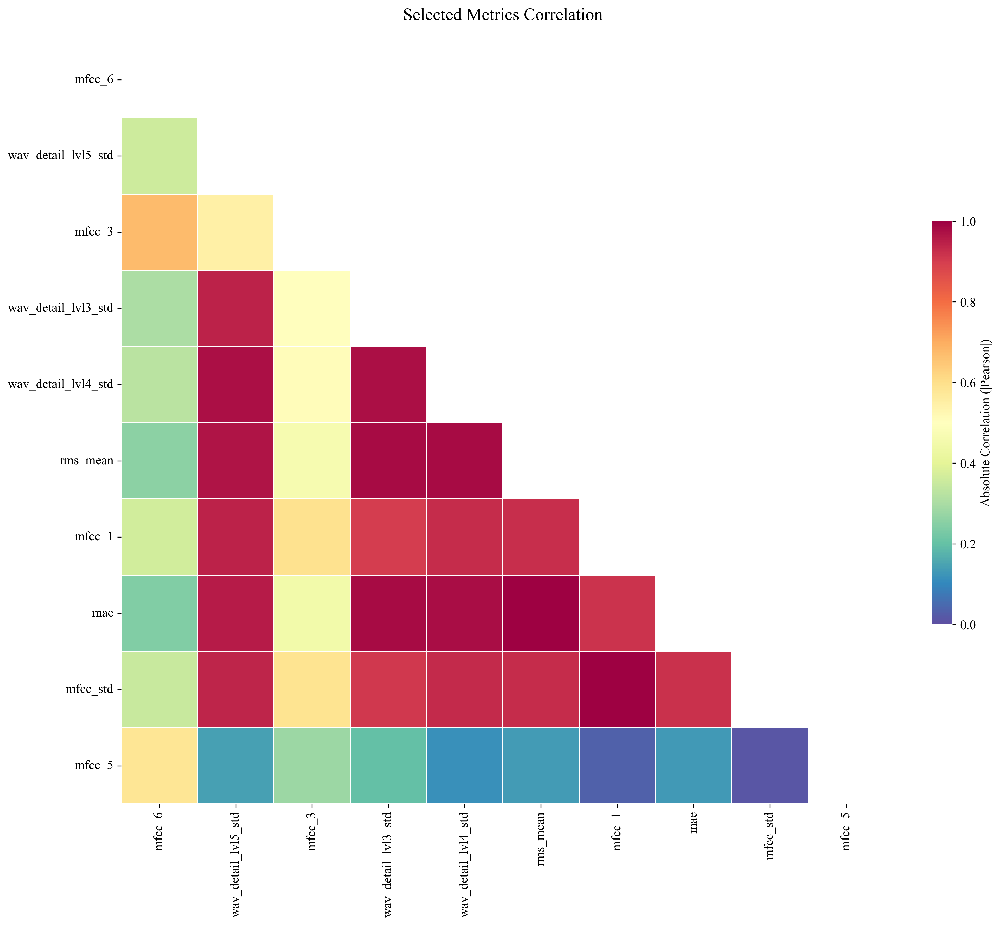

In [8]:
plot_correlation_heatmap(
    df=X_train_fischer_metrics,
    threshold=0.85,
    title=f"Selected Metrics Correlation"
)

17:51:47 - [FeaturePlots] - INFO - Generating Individual Boxplots for 10 features...


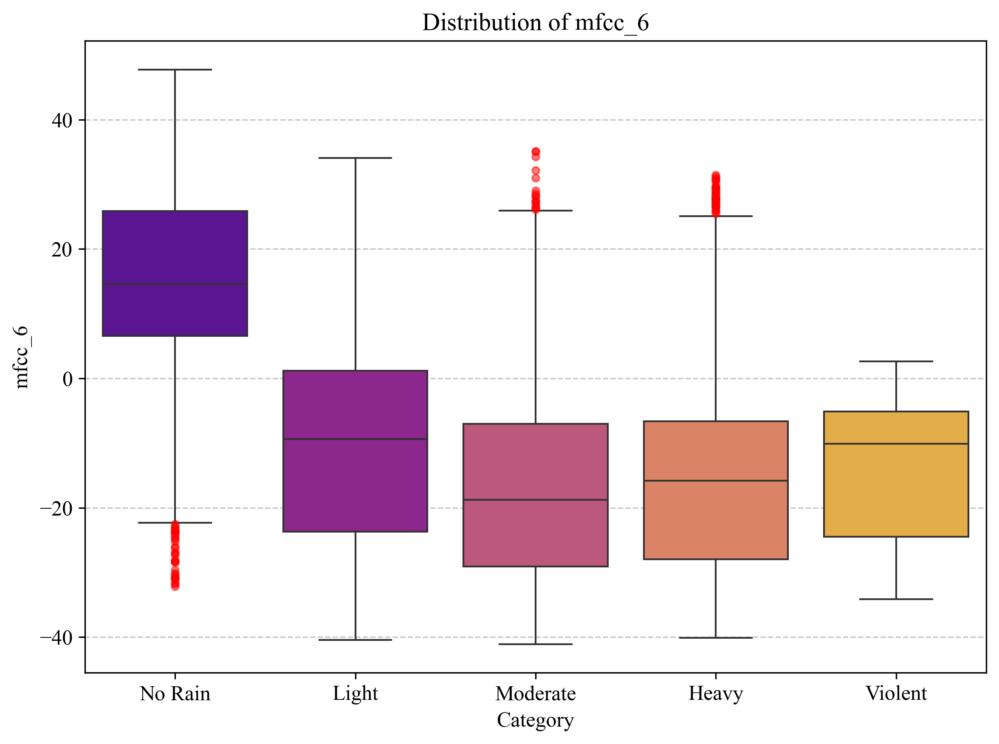

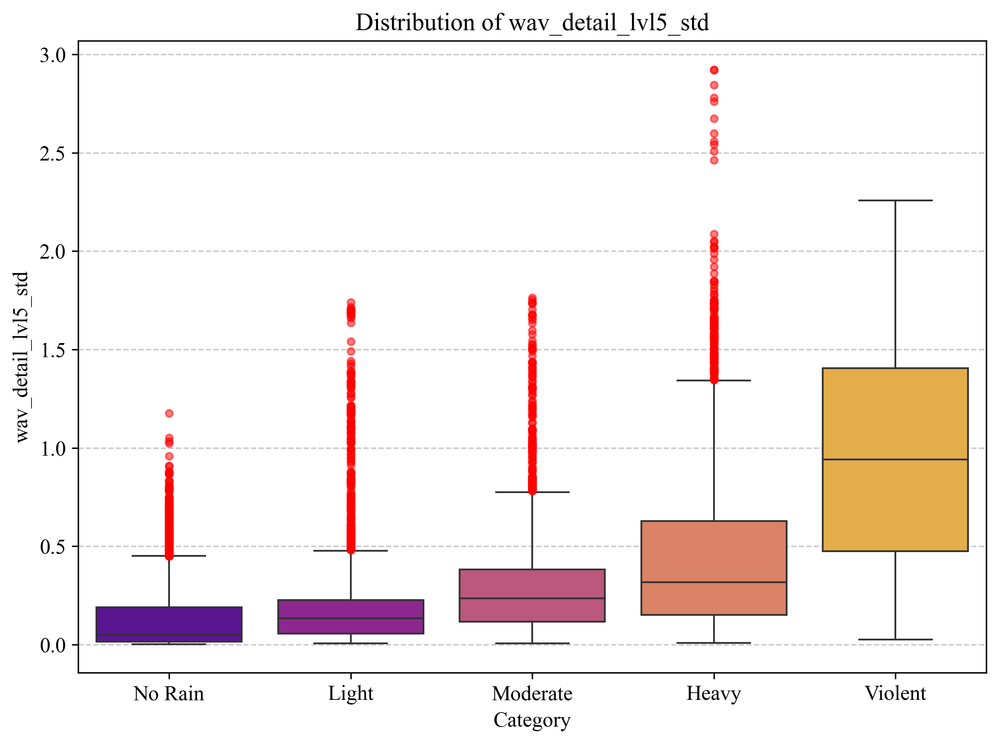

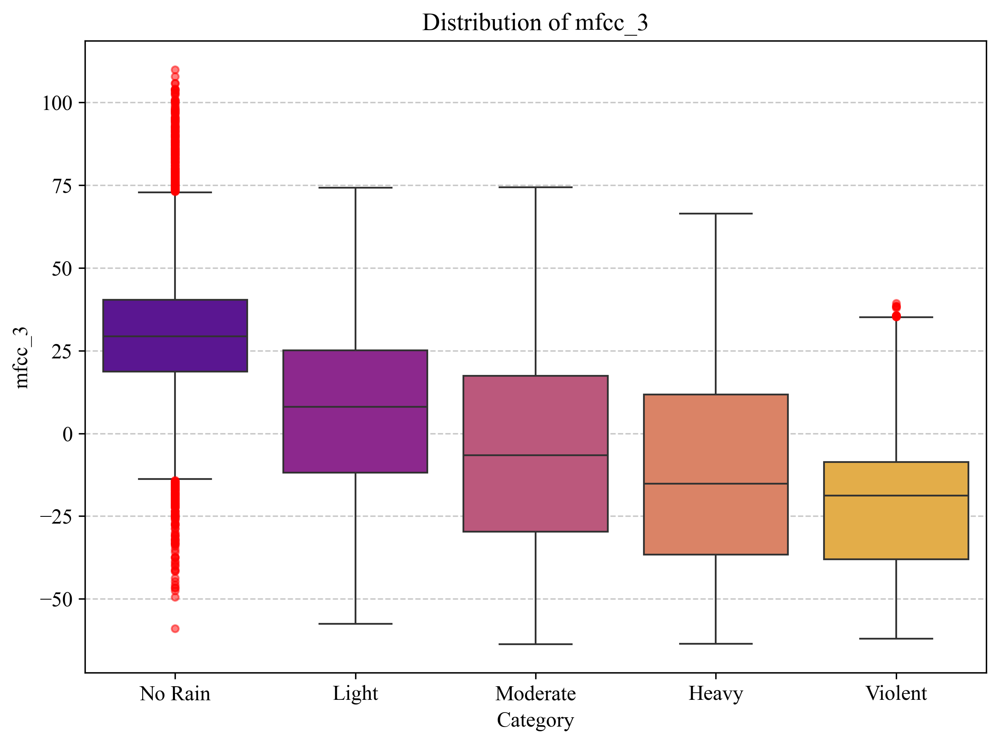

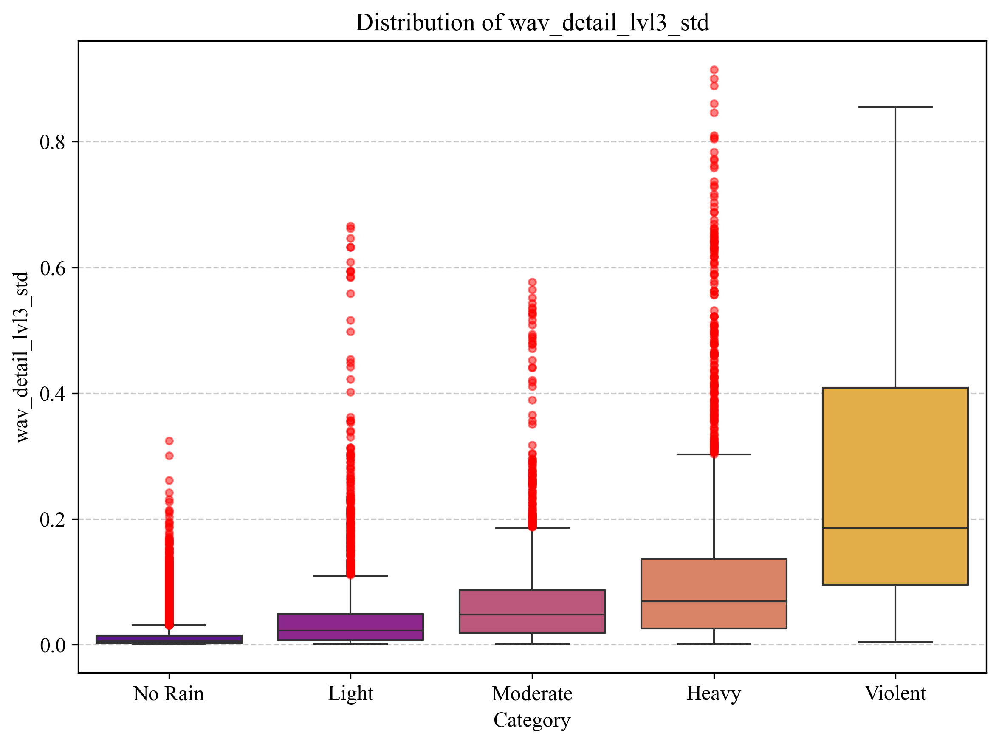

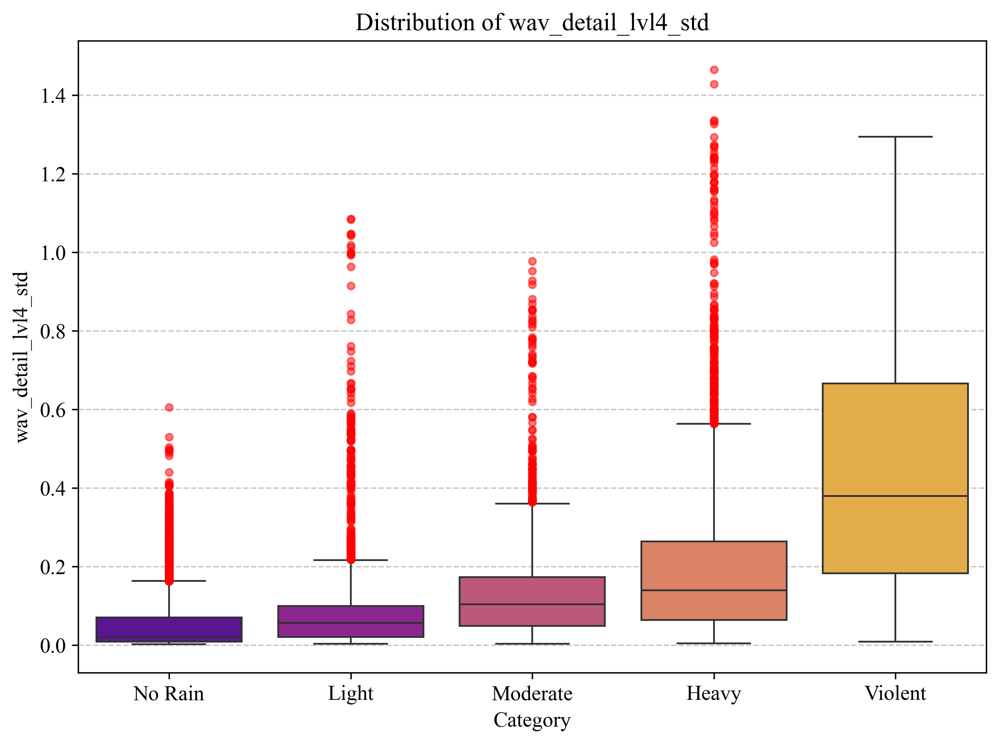

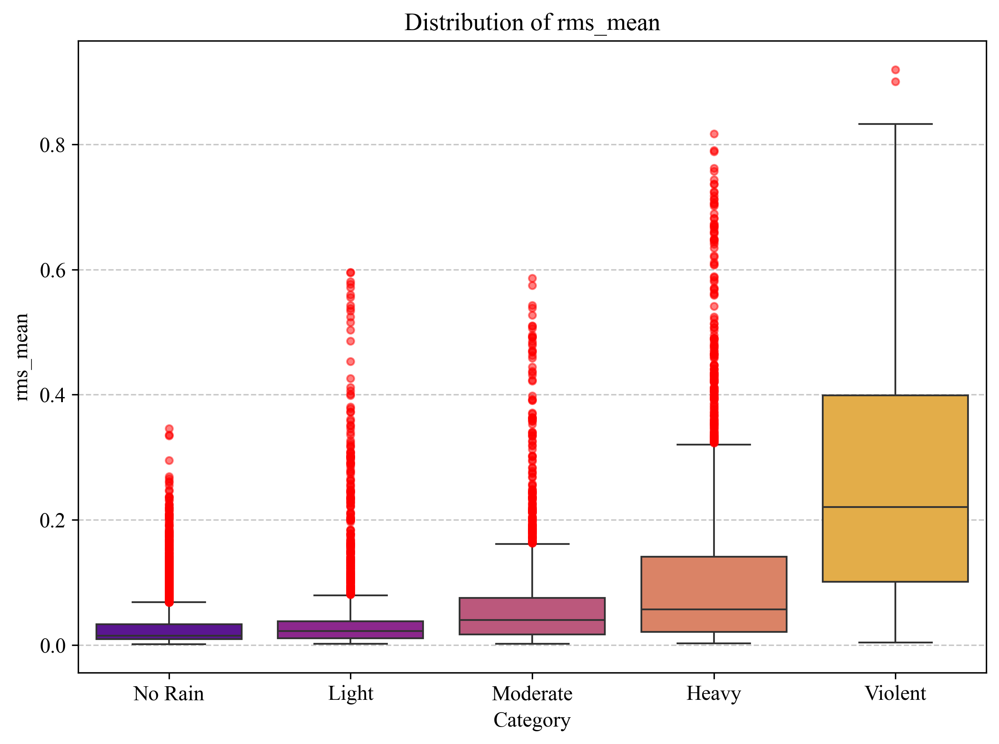

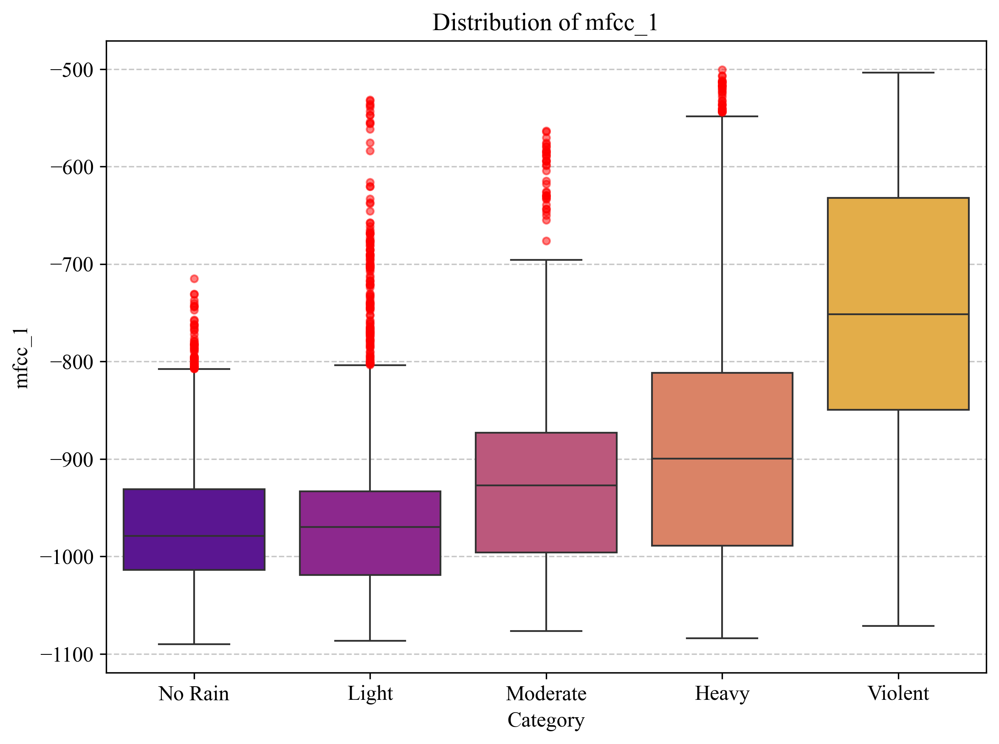

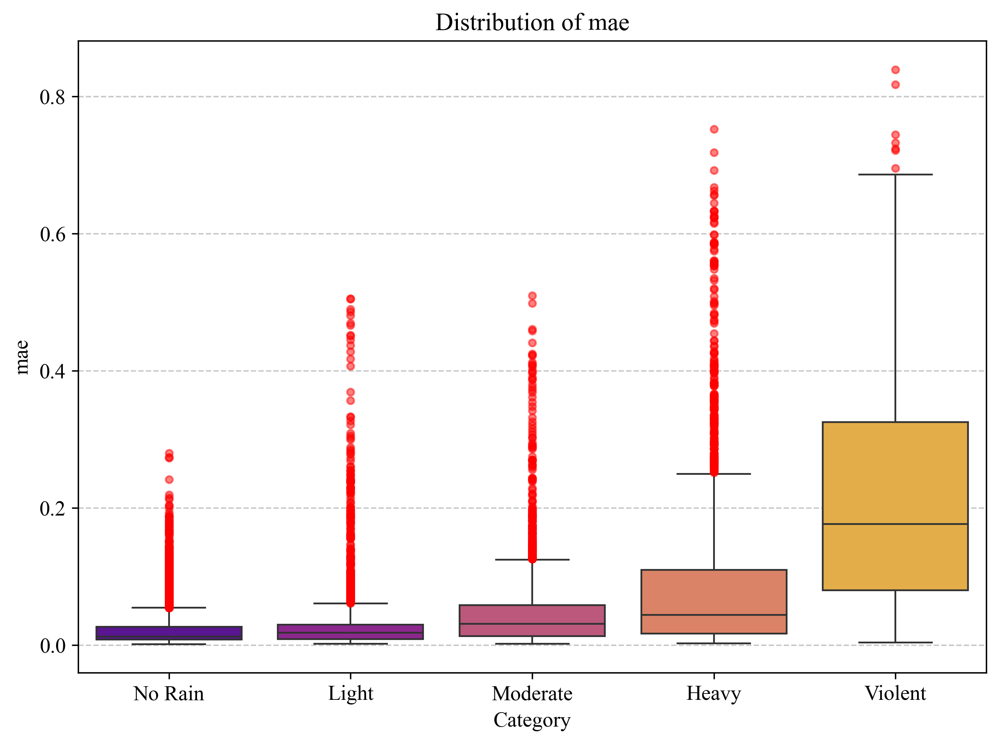

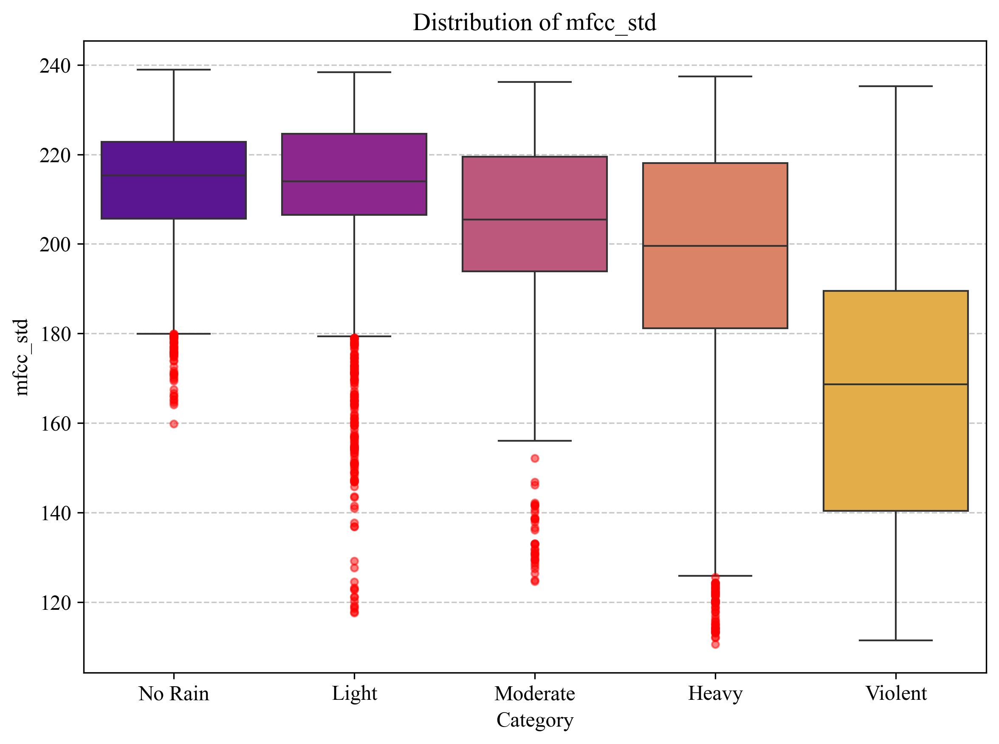

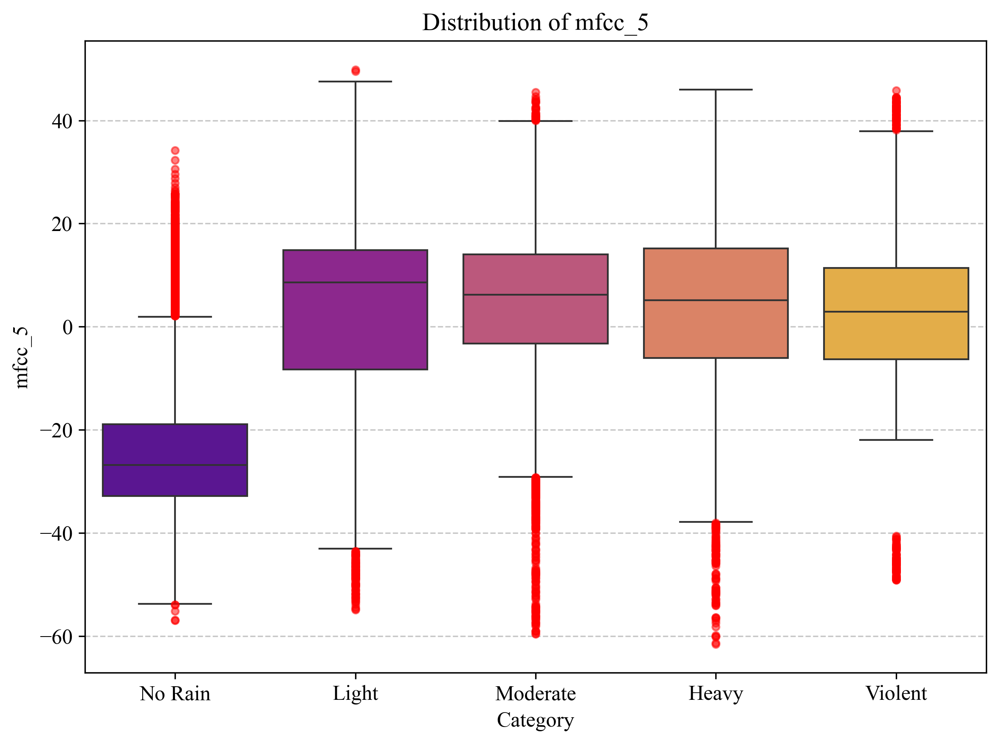

In [9]:
plot_individual_boxplots(
    X=X_train_fischer_metrics, 
    y=y_train, 
    color_map=rain_palette,
    class_order=ordered_classes
)

17:51:48 - [FeaturePlots] - INFO - Generating Fisher Score Plot (Top 10)...


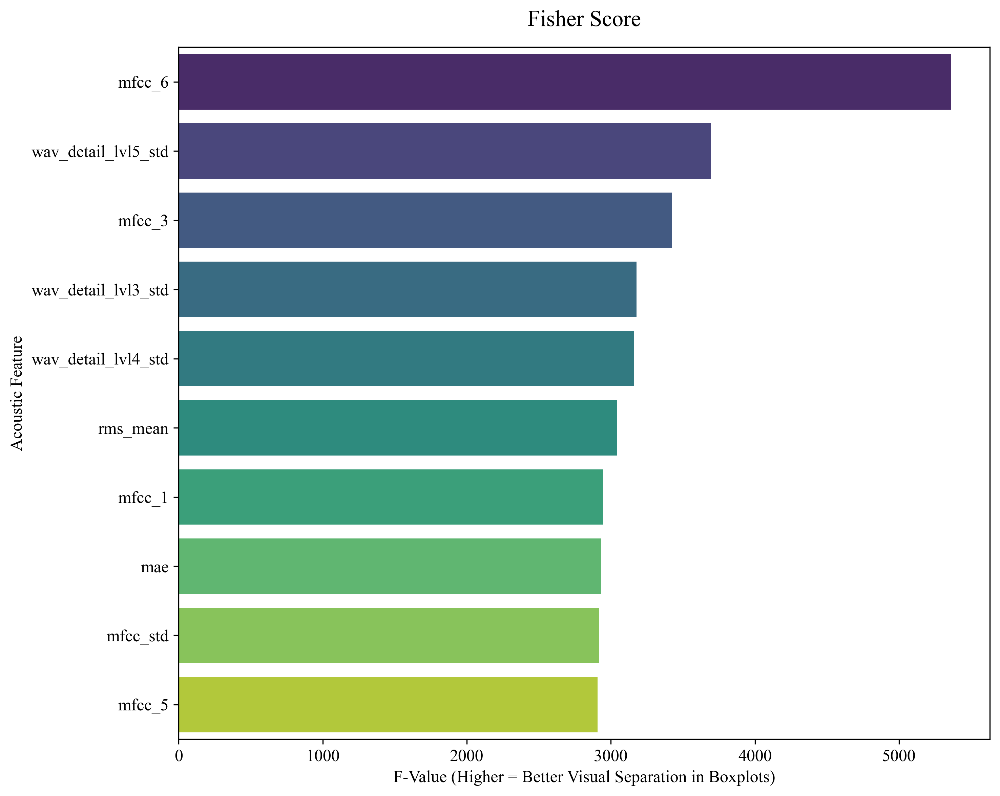

In [10]:
plot_fisher_scores(
    df_tracking=df_feature_tracking, 
    top_n=10,
    title="Fisher Score"
)

## PSD

In [5]:
psd_selector_config = SingleSelectorConfig(target_feature='psd_mean', 
                                           fisher_percentile=60)
psd_selector = build_single_selector(psd_selector_config)


X_train_psd = psd_selector.fit_transform(X_train, y_train)
print(f"Original Features: {X_train.shape[1]} -> Selected: {X_train_psd.shape[1]}")
print(f"Selected ones: {X_train_psd.columns}")

X_val_psd = psd_selector.transform(X_val)
X_test_psd = psd_selector.transform(X_test)

09:34:25 - [FeatureSelector] - INFO - Isolated 'psd_mean' | Fisher Score (F-Value): 1987.87
Original Features: 102 -> Selected: 1
Selected ones: Index(['psd_mean'], dtype='str')


In [6]:
plot_individual_boxplots(
    X=X_train_psd, 
    y=y_train, 
    color_map=rain_palette, 
    class_order=ordered_classes
)

NameError: name 'rain_palette' is not defined

# Modeling

In [5]:
from sklearn.preprocessing import LabelEncoder
import pandas as pd

# Instancia o codificador (tradutor de Texto para Número)
le = LabelEncoder()

# Transforma os textos ('Heavy', 'Light') em inteiros (0, 1, 2, 3, 4)
# e preserva o índice original do Pandas
y_train_enc = pd.Series(le.fit_transform(y_train), index=y_train.index, name=TARGET_COL)
y_val_enc   = pd.Series(le.transform(y_val), index=y_val.index, name=TARGET_COL)
y_test_enc  = pd.Series(le.transform(y_test), index=y_test.index, name=TARGET_COL)

print("✅ Variáveis 'y_train_enc', 'y_val_enc' e 'y_test_enc' recriadas e salvas na memória!")
print(f"Mapeamento interno: {dict(zip(le.classes_, le.transform(le.classes_)))}")

✅ Variáveis 'y_train_enc', 'y_val_enc' e 'y_test_enc' recriadas e salvas na memória!
Mapeamento interno: {'Heavy': np.int64(0), 'Light': np.int64(1), 'Moderate': np.int64(2), 'No Rain': np.int64(3), 'Violent': np.int64(4)}


## PSD

In [11]:
sgd_config = ClassifierConfig(model_type='sgd', random_state=42, n_jobs=-1)
sgd_base = ClassifierFactory.build(sgd_config)

sgd_grid = {
    'alpha': [0.0001, 0.001],
    'penalty': ['l2', 'elasticnet'],
    'class_weight': ['balanced']
}

tuning_config = TuningConfig(param_grid=sgd_grid, scoring_metric='f1_macro', n_jobs=-1)

sgd_champion = ModelOptimizer.optimize(
    estimator=sgd_base, 
    X_train=X_train_psd, 
    y_train=y_train, 
    X_val=X_val_psd, 
    y_val=y_val, 
    config=tuning_config
)

val_config = ValidationConfig(average_method='macro', return_report_dict=True)

metrics_sgd = ModelEvaluator.evaluate(
    model=sgd_champion, 
    X_test=X_test_psd, 
    y_test=y_test, 
    config=val_config
)

for chave, valor in metrics_sgd.items():
    if isinstance(valor, (int, float, str)):
        print(f" -> {chave}: {valor}")

19:32:50 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 14 cores.
19:32:50 - [ClassifierFactory] - INFO - Building registered model architecture: SGD
19:32:50 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 4 candidates, totalling 4 fits
19:32:53 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.1942
19:32:53 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'alpha': 0.0001, 'class_weight': 'balanced', 'penalty': 'elasticnet'}
19:32:53 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
19:32:53 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
19:32:53 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.1834 | PR-AUC: 0.3135770762753984
 -> f1_macro: 0.18339203680866561
 -> pr_auc_macro: 0.3135770762753984


In [12]:
lr_config = ClassifierConfig(model_type='lr', random_state=42)
lr_base = ClassifierFactory.build(lr_config)

lr_grid = {
    'C': [0.1, 1.0, 10.0], 
    'class_weight': ['balanced'], 
    'solver': ['lbfgs'], 
    'max_iter': [1000]
}

tuning_config_lr = TuningConfig(param_grid=lr_grid, scoring_metric='f1_macro', n_jobs=-1)

lr_champion = ModelOptimizer.optimize(
    estimator=lr_base, 
    X_train=X_train_psd, 
    y_train=y_train_enc,
    X_val=X_val_psd, 
    y_val=y_val_enc, 
    config=tuning_config_lr
)

val_config = ValidationConfig(average_method='macro', return_report_dict=True)
metrics_lr = ModelEvaluator.evaluate(
    model=lr_champion, 
    X_test=X_test_psd, 
    y_test=y_test_enc, 
    config=val_config
)

for chave, valor in metrics_lr.items():
    if isinstance(valor, (int, float, str)):
        print(f" -> {chave}: {valor}")


19:32:53 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 14 cores.
19:32:53 - [ClassifierFactory] - INFO - Building registered model architecture: LR
19:32:53 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 3 candidates, totalling 3 fits
19:32:55 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.2481
19:32:55 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'C': 10.0, 'class_weight': 'balanced', 'max_iter': 1000, 'solver': 'lbfgs'}
19:32:55 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
19:32:55 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
19:32:55 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.2885 | PR-AUC: 0.3187642779296312
 -> f1_macro: 0.2885004499780009
 -> pr_auc_macro: 0.3187642779296312


In [23]:
rf_config = ClassifierConfig(model_type='rf', random_state=42)
rf_base = ClassifierFactory.build(rf_config)

rf_grid = {
    'n_estimators': [100, 200], 
    'max_depth': [None, 5, 10], 
    'min_samples_leaf': [1, 2]
}
tuning_config_rf = TuningConfig(param_grid=rf_grid, scoring_metric='f1_macro', n_jobs=-1)

rf_champion = ModelOptimizer.optimize(
    estimator=rf_base, 
    X_train=X_train_psd, 
    y_train=y_train_enc, 
    X_val=X_val_psd, 
    y_val=y_val_enc, 
    config=tuning_config_rf
)

metrics_rf = ModelEvaluator.evaluate(
    model=rf_champion, 
    X_test=X_test_psd, 
    y_test=y_test_enc, 
    config=val_config
)

for chave, valor in metrics_rf.items():
    if isinstance(valor, (int, float, str)):
        print(f" -> {chave}: {valor}")

09:01:19 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 26 cores.
09:01:19 - [ClassifierFactory] - INFO - Building registered model architecture: RF
09:01:19 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 12 candidates, totalling 12 fits
09:01:22 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.3111
09:01:22 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'max_depth': 10, 'min_samples_leaf': 2, 'n_estimators': 200}
09:01:22 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
09:01:22 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
09:01:22 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.2925 | PR-AUC: 0.3024484770255046
 -> f1_macro: 0.2924556702471519
 -> pr_auc_macro: 0.3024484770255046


In [24]:
xgb_config = ClassifierConfig(model_type='xgb', random_state=42)
xgb_base = ClassifierFactory.build(xgb_config)

xgb_grid = {
    'n_estimators': [100, 200], 
    'max_depth': [3, 5], 
    'learning_rate': [0.01, 0.1]
}
tuning_config_xgb = TuningConfig(param_grid=xgb_grid, scoring_metric='f1_macro', n_jobs=-1)

xgb_champion = ModelOptimizer.optimize(
    estimator=xgb_base, 
    X_train=X_train_psd, 
    y_train=y_train_enc, # OBRIGATÓRIO: Variável Numérica (0 a 4)
    X_val=X_val_psd, 
    y_val=y_val_enc,     # OBRIGATÓRIO: Variável Numérica (0 a 4)
    config=tuning_config_xgb
)

metrics_xgb = ModelEvaluator.evaluate(
    model=xgb_champion, 
    X_test=X_test_psd, 
    y_test=y_test_enc,   # OBRIGATÓRIO: Variável Numérica (0 a 4)
    config=val_config
)

for chave, valor in metrics_xgb.items():
    if isinstance(valor, (int, float, str)):
        print(f" -> {chave}: {valor}")

09:01:23 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 26 cores.
09:01:23 - [ClassifierFactory] - INFO - Building registered model architecture: XGB
09:01:23 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 8 candidates, totalling 8 fits
09:01:25 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.2127
09:01:25 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200}
09:01:25 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
09:01:26 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
09:01:26 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.2000 | PR-AUC: 0.3090526963971242
 -> f1_macro: 0.2000297085668164
 -> pr_auc_macro: 0.3090526963971242


## Selected Metrics

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns

MAX_FEATURES = 10
top_10_features = df_feature_tracking[df_feature_tracking['Survived_Pipeline'] == 1]['Feature_Name'].head(MAX_FEATURES).tolist()

09:34:39 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 14 cores.
--- Treinando com 1 Feature(s) [Adicionada agora: mfcc_6] ---
09:34:39 - [ClassifierFactory] - INFO - Building registered model architecture: SGD
09:34:39 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 4 candidates, totalling 4 fits
09:34:43 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.2817
09:34:43 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'alpha': 0.001, 'class_weight': 'balanced', 'penalty': 'l2'}
09:34:43 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
09:34:43 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
09:34:43 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.3112 | PR-AUC: 0.40456974177842503
--- Treinando com 2 Feature(s) [Adicionada agora: wav_detail_lvl5_std] ---

,Dimensao,Ultima_Feature_Inclusa,F1_Macro,Accuracy
0,1,mfcc_6,0.311207,0.0
1,2,wav_detail_lvl5_std,0.426367,0.0
2,3,mfcc_3,0.443422,0.0
3,4,wav_detail_lvl3_std,0.439443,0.0
4,5,wav_detail_lvl4_std,0.458294,0.0
5,6,rms_mean,0.453176,0.0
6,7,mfcc_1,0.423545,0.0
7,8,mae,0.437589,0.0
8,9,mfcc_std,0.434166,0.0
9,10,mfcc_5,0.439394,0.0


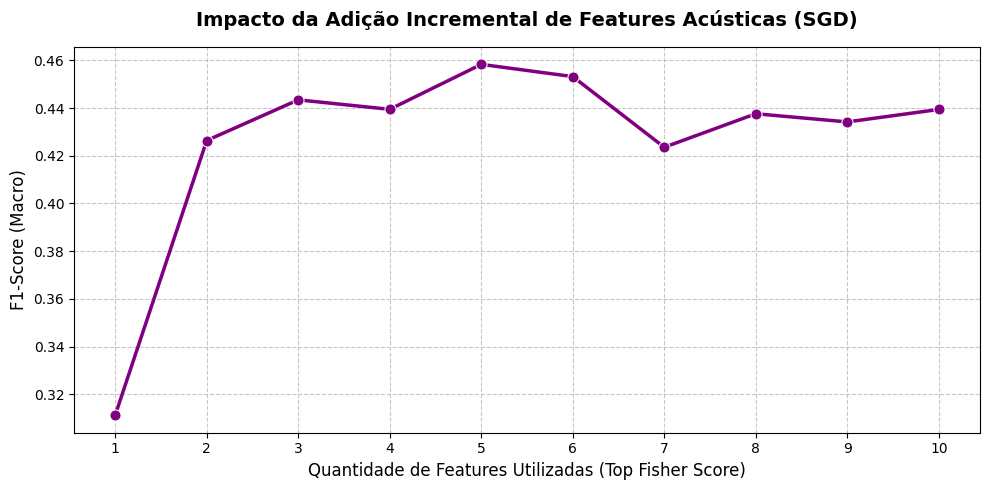

In [9]:
sgd_config = ClassifierConfig(model_type='sgd', random_state=42)
sgd_grid = {
    'alpha': [0.0001, 0.001], 
    'penalty': ['l2', 'elasticnet'], 
    'class_weight': ['balanced']
}
tuning_config_sgd = TuningConfig(param_grid=sgd_grid, scoring_metric='f1_macro', n_jobs=-1)
val_config = ValidationConfig(average_method='macro', return_report_dict=False)

incremental_results_sgd = []

for k in range(1, MAX_FEATURES + 1):
    current_features = top_10_features[:k]
    feature_adicionada = current_features[-1]
    
    print(f"--- Treinando com {k} Feature(s) [Adicionada agora: {feature_adicionada}] ---")
    
    # Fatiamento da matriz usando as listas de nomes
    X_tr_slice = X_train_selected_metrics[current_features]
    X_va_slice = X_val_selected_metrics[current_features]
    X_te_slice = X_test_selected_metrics[current_features]
    
    try:
        # A. Constrói o modelo
        sgd_base = ClassifierFactory.build(sgd_config)
        
        # B. Otimiza (Tuning)
        sgd_champion = ModelOptimizer.optimize(
            estimator=sgd_base, 
            X_train=X_tr_slice, 
            y_train=y_train_enc, # Usando a variável numérica que criamos para evitar erros
            X_val=X_va_slice, 
            y_val=y_val_enc, 
            config=tuning_config_sgd
        )
        
        # C. Avalia no Teste (O veredito final daquele conjunto)
        metrics_sgd = ModelEvaluator.evaluate(
            model=sgd_champion, 
            X_test=X_te_slice, 
            y_test=y_test_enc, 
            config=val_config
        )
        
        # D. Extração Segura das Métricas (Tratando possíveis mudanças no dicionário)
        f1  = metrics_sgd.get('f1_macro', metrics_sgd.get('f1_score', metrics_sgd.get('f1', 0.0)))
        acc = metrics_sgd.get('accuracy', metrics_sgd.get('accuracy_score', 0.0))
        
        incremental_results_sgd.append({
            'Dimensao': k,
            'Ultima_Feature_Inclusa': feature_adicionada,
            'F1_Macro': f1,
            'Accuracy': acc
        })
        
    except Exception as e:
        print(f"❌ Falha no passo com {k} features: {e}")

# 4. Tabela de Resultados
df_sgd_incremental = pd.DataFrame(incremental_results_sgd)
print("\n📊 Tabela de Desempenho Incremental:")
display(df_sgd_incremental)

# 5. O Gráfico Definitivo (Curva de Aprendizado por Dimensão)
plt.figure(figsize=(10, 5))
sns.lineplot(
    data=df_sgd_incremental, 
    x='Dimensao', 
    y='F1_Macro', 
    marker='o', 
    color='purple', 
    linewidth=2.5,
    markersize=8
)

plt.title("Impacto da Adição Incremental de Features Acústicas (SGD)", fontsize=14, fontweight='bold', pad=15)
plt.xlabel("Quantidade de Features Utilizadas (Top Fisher Score)", fontsize=12)
plt.ylabel("F1-Score (Macro)", fontsize=12)
plt.xticks(range(1, MAX_FEATURES + 1))
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()

# Salva se a pasta REPORTS_DIR estiver definida
if 'REPORTS_DIR' in locals():
    plt.savefig(REPORTS_DIR / f"{DATASET}_E{EXP_NUM}_SGD_Incremental.pdf", dpi=300, bbox_inches='tight')

plt.show()

🚀 Teste de Escalonamento de Features (Incremental) - Regressão Logística (LR)
09:01:57 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 26 cores.
--- Treinando LR com 1 Feature(s) [+ mfcc_6] ---
09:01:57 - [ClassifierFactory] - INFO - Building registered model architecture: LR
09:01:57 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 3 candidates, totalling 3 fits
09:01:57 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.3368
09:01:57 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'C': 0.1, 'class_weight': 'balanced', 'max_iter': 1000, 'solver': 'lbfgs'}
09:01:57 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
09:01:57 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
09:01:57 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.3834 | PR-AUC: 0.40316092765095

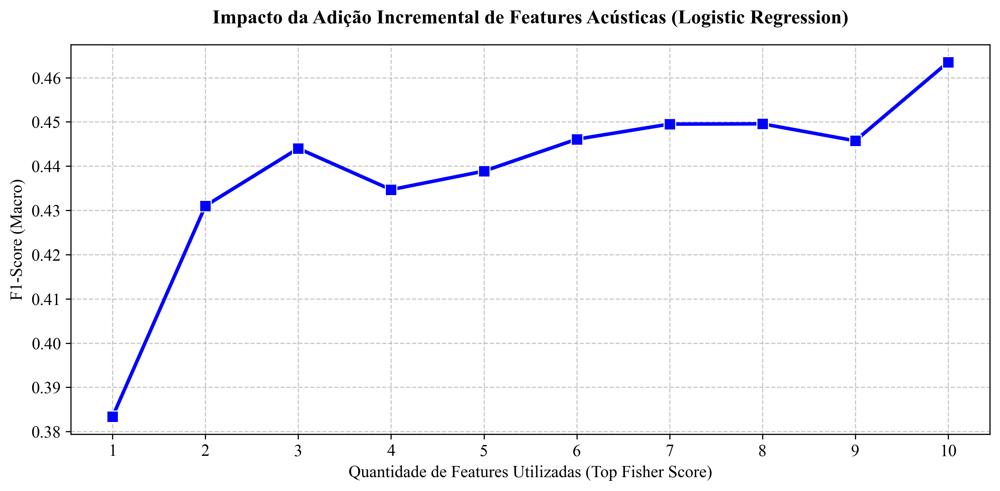

In [27]:
# ==============================================================================
# Teste Unitário de Dimensão: Incremental Feature Scaling no LR
# ==============================================================================
print("="*60)
print("🚀 Teste de Escalonamento de Features (Incremental) - Regressão Logística (LR)")
print("="*60)

# Configurações do LR
lr_config = ClassifierConfig(model_type='lr', random_state=42)
lr_grid = {
    'C': [0.1, 1.0, 10.0], 
    'class_weight': ['balanced'], 
    'solver': ['lbfgs'], 
    'max_iter': [1000]
}
tuning_config_lr = TuningConfig(param_grid=lr_grid, scoring_metric='f1_macro', n_jobs=-1)

incremental_results_lr = []

for k in range(1, MAX_FEATURES + 1):
    current_features = top_10_features[:k]
    feature_adicionada = current_features[-1]
    print(f"--- Treinando LR com {k} Feature(s) [+ {feature_adicionada}] ---")
    
    X_tr_slice = X_train_selected_metrics[current_features]
    X_va_slice = X_val_selected_metrics[current_features]
    X_te_slice = X_test_selected_metrics[current_features]
    
    try:
        lr_base = ClassifierFactory.build(lr_config)
        lr_champion = ModelOptimizer.optimize(
            estimator=lr_base, X_train=X_tr_slice, y_train=y_train_enc, 
            X_val=X_va_slice, y_val=y_val_enc, config=tuning_config_lr
        )
        metrics_lr = ModelEvaluator.evaluate(model=lr_champion, X_test=X_te_slice, y_test=y_test_enc, config=val_config)
        
        f1  = metrics_lr.get('f1_macro', metrics_lr.get('f1_score', metrics_lr.get('f1', 0.0)))
        acc = metrics_lr.get('accuracy', metrics_lr.get('accuracy_score', 0.0))
        
        incremental_results_lr.append({'Dimensao': k, 'Ultima_Feature_Inclusa': feature_adicionada, 'F1_Macro': f1, 'Accuracy': acc})
    except Exception as e:
        print(f"❌ Falha no passo com {k} features: {e}")

# Gráfico
df_lr_incremental = pd.DataFrame(incremental_results_lr)
plt.figure(figsize=(10, 5))
sns.lineplot(data=df_lr_incremental, x='Dimensao', y='F1_Macro', marker='s', color='blue', linewidth=2.5, markersize=8)
plt.title("Impacto da Adição Incremental de Features Acústicas (Logistic Regression)", fontsize=14, fontweight='bold', pad=15)
plt.xlabel("Quantidade de Features Utilizadas (Top Fisher Score)", fontsize=12)
plt.ylabel("F1-Score (Macro)", fontsize=12)
plt.xticks(range(1, MAX_FEATURES + 1))
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

🚀 Teste de Escalonamento de Features (Incremental) - Random Forest (RF)
09:02:10 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 26 cores.
--- Treinando RF com 1 Feature(s) [+ mfcc_6] ---
09:02:10 - [ClassifierFactory] - INFO - Building registered model architecture: RF
09:02:10 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 12 candidates, totalling 12 fits
09:02:11 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.3313
09:02:11 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'max_depth': None, 'min_samples_leaf': 2, 'n_estimators': 100}
09:02:11 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
09:02:12 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
09:02:12 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.3302 | PR-AUC: 0.3356124327497522
--- Treinando

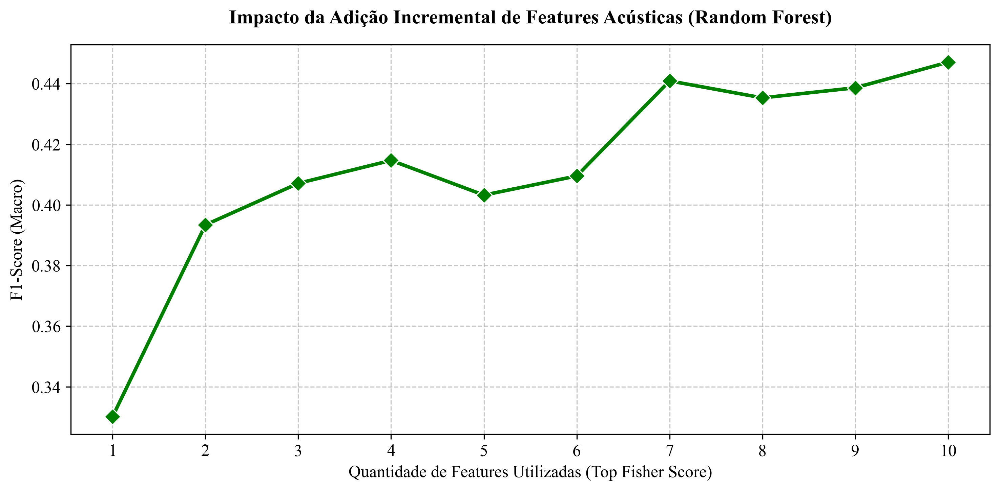

In [28]:
# ==============================================================================
# Teste Unitário de Dimensão: Incremental Feature Scaling no RF
# ==============================================================================
print("="*60)
print("🚀 Teste de Escalonamento de Features (Incremental) - Random Forest (RF)")
print("="*60)

# Configurações do RF
rf_config = ClassifierConfig(model_type='rf', random_state=42)
rf_grid = {
    'n_estimators': [100, 200], 
    'max_depth': [None, 5, 10], 
    'min_samples_leaf': [1, 2]
}
tuning_config_rf = TuningConfig(param_grid=rf_grid, scoring_metric='f1_macro', n_jobs=-1)

incremental_results_rf = []

for k in range(1, MAX_FEATURES + 1):
    current_features = top_10_features[:k]
    feature_adicionada = current_features[-1]
    print(f"--- Treinando RF com {k} Feature(s) [+ {feature_adicionada}] ---")
    
    X_tr_slice = X_train_selected_metrics[current_features]
    X_va_slice = X_val_selected_metrics[current_features]
    X_te_slice = X_test_selected_metrics[current_features]
    
    try:
        rf_base = ClassifierFactory.build(rf_config)
        rf_champion = ModelOptimizer.optimize(
            estimator=rf_base, X_train=X_tr_slice, y_train=y_train_enc, 
            X_val=X_va_slice, y_val=y_val_enc, config=tuning_config_rf
        )
        metrics_rf = ModelEvaluator.evaluate(model=rf_champion, X_test=X_te_slice, y_test=y_test_enc, config=val_config)
        
        f1  = metrics_rf.get('f1_macro', metrics_rf.get('f1_score', metrics_rf.get('f1', 0.0)))
        acc = metrics_rf.get('accuracy', metrics_rf.get('accuracy_score', 0.0))
        
        incremental_results_rf.append({'Dimensao': k, 'Ultima_Feature_Inclusa': feature_adicionada, 'F1_Macro': f1, 'Accuracy': acc})
    except Exception as e:
        print(f"❌ Falha no passo com {k} features: {e}")

# Gráfico
df_rf_incremental = pd.DataFrame(incremental_results_rf)
plt.figure(figsize=(10, 5))
sns.lineplot(data=df_rf_incremental, x='Dimensao', y='F1_Macro', marker='D', color='green', linewidth=2.5, markersize=8)
plt.title("Impacto da Adição Incremental de Features Acústicas (Random Forest)", fontsize=14, fontweight='bold', pad=15)
plt.xlabel("Quantidade de Features Utilizadas (Top Fisher Score)", fontsize=12)
plt.ylabel("F1-Score (Macro)", fontsize=12)
plt.xticks(range(1, MAX_FEATURES + 1))
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

🚀 Teste de Escalonamento de Features (Incremental) - XGBoost (XGB)
09:02:43 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 26 cores.
--- Treinando XGB com 1 Feature(s) [+ mfcc_6] ---
09:02:43 - [ClassifierFactory] - INFO - Building registered model architecture: XGB
09:02:43 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 8 candidates, totalling 8 fits
09:02:44 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.3023
09:02:44 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200}
09:02:44 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
09:02:44 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
09:02:44 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.3542 | PR-AUC: 0.39680231673318106
--- Treinando XGB com

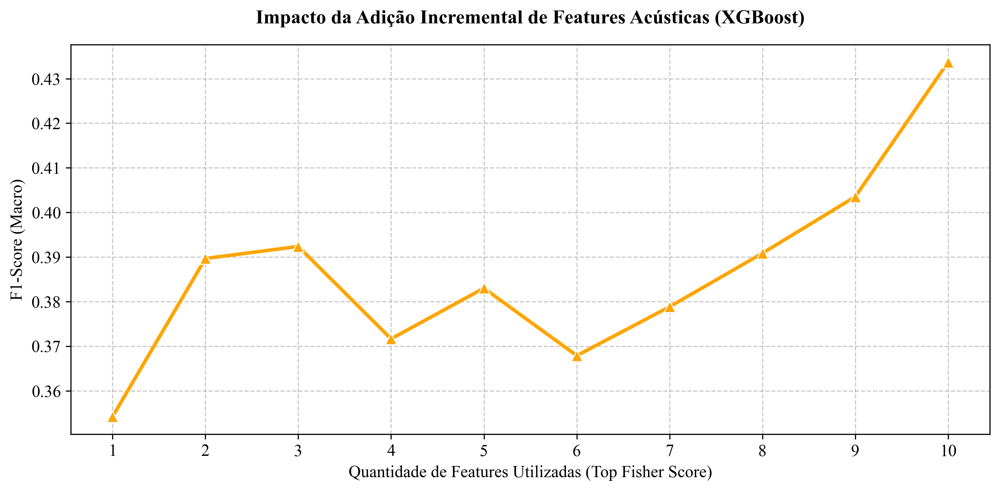

In [29]:
# ==============================================================================
# Teste Unitário de Dimensão: Incremental Feature Scaling no XGBoost
# ==============================================================================
print("="*60)
print("🚀 Teste de Escalonamento de Features (Incremental) - XGBoost (XGB)")
print("="*60)

# Configurações do XGBoost
xgb_config = ClassifierConfig(model_type='xgb', random_state=42)
xgb_grid = {
    'n_estimators': [100, 200], 
    'max_depth': [3, 5], 
    'learning_rate': [0.01, 0.1]
}
tuning_config_xgb = TuningConfig(param_grid=xgb_grid, scoring_metric='f1_macro', n_jobs=-1)

incremental_results_xgb = []

for k in range(1, MAX_FEATURES + 1):
    current_features = top_10_features[:k]
    feature_adicionada = current_features[-1]
    print(f"--- Treinando XGB com {k} Feature(s) [+ {feature_adicionada}] ---")
    
    X_tr_slice = X_train_selected_metrics[current_features]
    X_va_slice = X_val_selected_metrics[current_features]
    X_te_slice = X_test_selected_metrics[current_features]
    
    try:
        xgb_base = ClassifierFactory.build(xgb_config)
        xgb_champion = ModelOptimizer.optimize(
            estimator=xgb_base, X_train=X_tr_slice, y_train=y_train_enc, 
            X_val=X_va_slice, y_val=y_val_enc, config=tuning_config_xgb
        )
        metrics_xgb = ModelEvaluator.evaluate(model=xgb_champion, X_test=X_te_slice, y_test=y_test_enc, config=val_config)
        
        f1  = metrics_xgb.get('f1_macro', metrics_xgb.get('f1_score', metrics_xgb.get('f1', 0.0)))
        acc = metrics_xgb.get('accuracy', metrics_xgb.get('accuracy_score', 0.0))
        
        incremental_results_xgb.append({'Dimensao': k, 'Ultima_Feature_Inclusa': feature_adicionada, 'F1_Macro': f1, 'Accuracy': acc})
    except Exception as e:
        print(f"❌ Falha no passo com {k} features: {e}")

# Gráfico
df_xgb_incremental = pd.DataFrame(incremental_results_xgb)
plt.figure(figsize=(10, 5))
sns.lineplot(data=df_xgb_incremental, x='Dimensao', y='F1_Macro', marker='^', color='orange', linewidth=2.5, markersize=8)
plt.title("Impacto da Adição Incremental de Features Acústicas (XGBoost)", fontsize=14, fontweight='bold', pad=15)
plt.xlabel("Quantidade de Features Utilizadas (Top Fisher Score)", fontsize=12)
plt.ylabel("F1-Score (Macro)", fontsize=12)
plt.xticks(range(1, MAX_FEATURES + 1))
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

🚀 Teste de Escalonamento (Bare-Metal) - MASTER MODEL (NuSVC Poly)
--- Treinando Master Model com 1 Feature(s) [+ mfcc_6] ---
09:07:31 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
09:07:32 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.2096 | PR-AUC: 0.36513451839132366
--- Treinando Master Model com 2 Feature(s) [+ wav_detail_lvl5_std] ---
09:07:56 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
09:07:56 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.3033 | PR-AUC: 0.4067298538375642
--- Treinando Master Model com 3 Feature(s) [+ mfcc_3] ---
09:08:16 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
09:08:16 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.2883 | PR-AUC: 0.4013855450503976
--- Treinando Master Model com 4 Feature(s) [+ wav_detail_lvl3_std] ---
09:09:50 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
09:09:51 - [Mo

,Dimensao,Ultima_Feature_Inclusa,F1_Macro
0,1,mfcc_6,0.209591
1,2,wav_detail_lvl5_std,0.303337
2,3,mfcc_3,0.288346
3,4,wav_detail_lvl3_std,0.307132
4,5,wav_detail_lvl4_std,0.314264
5,6,rms_mean,0.325830
6,7,mfcc_1,0.276889
7,8,mae,0.301840
8,9,mfcc_std,0.324542
9,10,mfcc_5,0.397660


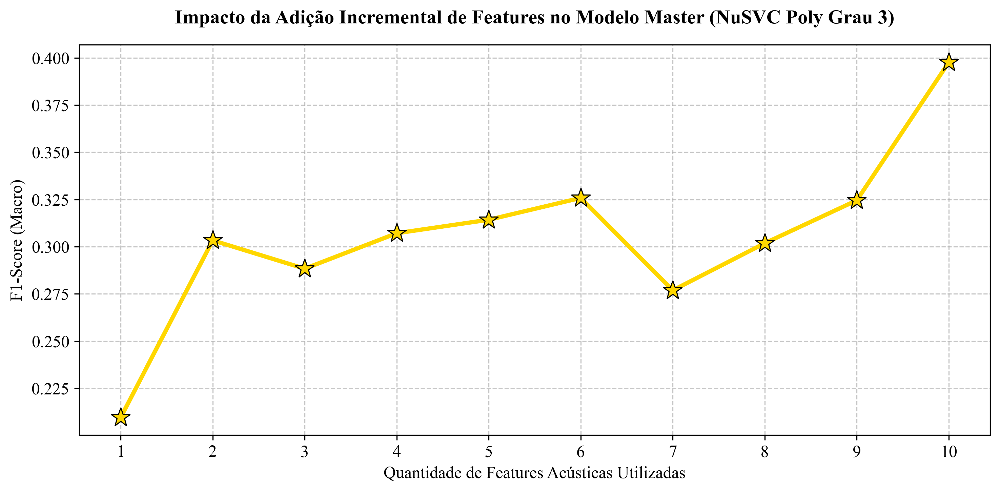

In [ ]:
# ==============================================================================
# Teste Unitário de Dimensão: Incremental Feature Scaling (IDSM's NuSVC Poly)
# ==============================================================================
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.svm import NuSVC

from rainfall_acoustic_classification.modeling.validation import ModelEvaluator, ValidationConfig

print("="*60)
print("🚀 Teste de Escalonamento (Bare-Metal) - MASTER MODEL (NuSVC Poly)")
print("="*60)

MAX_FEATURES = 10

# Declaração da configuração de validação
val_config = ValidationConfig(average_method='macro', return_report_dict=False)

incremental_results_master = []

# Loop Incremental do Doutorando
for k in range(1, MAX_FEATURES + 1):
    current_features = top_10_features[:k]
    feature_adicionada = current_features[-1]
    
    print(f"--- Treinando Master Model com {k} Feature(s) [+ {feature_adicionada}] ---")
    
    # Fatiamento DIRETO (Sem necessidade de carregar X_val)
    X_tr_slice = X_train_selected_metrics[current_features]
    X_te_slice = X_test_selected_metrics[current_features]
    
    try:
        # 1. Instanciação Direta (Bypass do Otimizador e da Factory)
        clf_master = NuSVC(
            kernel='poly', 
            degree=3, 
            coef0=1.0, 
            nu=0.5, 
            gamma='scale', 
            class_weight='balanced', 
            probability=True, 
            random_state=42
        )
        
        # 2. Treinamento Direto no Conjunto de Treino
        clf_master.fit(X_tr_slice, y_train_enc)
        
        # 3. Avaliação Inviolável no Conjunto de Teste
        metrics_master = ModelEvaluator.evaluate(
            model=clf_master, 
            X_test=X_te_slice, 
            y_test=y_test_enc, 
            config=val_config
        )
        
        # Puxando o F1 Macro com segurança
        f1 = metrics_master.get('f1_macro', metrics_master.get('f1_score', metrics_master.get('f1', 0.0)))
        
        incremental_results_master.append({
            'Dimensao': k,
            'Ultima_Feature_Inclusa': feature_adicionada,
            'F1_Macro': f1
        })
        
    except Exception as e:
        print(f"❌ Falha no passo com {k} features: {e}")
        # Se 'nu=0.5' for impossível para as primeiras dimensões (ex: 1, 2 ou 3 features),
        # o try/except absorve o erro 'infeasible' e o gráfico plotará a curva a partir 
        # da dimensão onde a matemática passa a funcionar.

# ------------------------------------------------------------------------------
# Resultados e Gráfico
# ------------------------------------------------------------------------------
df_master_incremental = pd.DataFrame(incremental_results_master)
print("\n📊 Tabela de Desempenho Incremental (Master Model):")
display(df_master_incremental)

plt.figure(figsize=(10, 5))
sns.lineplot(
    data=df_master_incremental, 
    x='Dimensao', 
    y='F1_Macro', 
    marker='*', 
    color='gold', 
    markeredgecolor='black',
    linewidth=3.0,
    markersize=14
)

plt.title("Impacto da Adição Incremental de Features no Modelo Master (NuSVC Poly Grau 3)", fontsize=14, fontweight='bold', pad=15)
plt.xlabel("Quantidade de Features Acústicas Utilizadas", fontsize=12)
plt.ylabel("F1-Score (Macro)", fontsize=12)

# Força o eixo X a exibir os números corretos baseados nas dimensões que rodaram com sucesso
if not df_master_incremental.empty:
    plt.xticks(df_master_incremental['Dimensao'].tolist())
    
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()

if 'REPORTS_DIR' in locals():
    plt.savefig(REPORTS_DIR / f"{DATASET}_E{EXP_NUM}_MasterModel_Incremental.pdf", dpi=300, bbox_inches='tight')

plt.show()

In [11]:
# ==============================================================================
# Sniper Tuning (Ambiente Ruidoso/UECE): Explorando Topologia RBF e Linear
# ==============================================================================
import time
from rainfall_acoustic_classification.modeling.classifiers import ClassifierFactory, ClassifierConfig
from rainfall_acoustic_classification.modeling.tuning import ModelOptimizer, TuningConfig
from rainfall_acoustic_classification.modeling.validation import ModelEvaluator, ValidationConfig

print("="*60)
print(f"🎯 Sniper Tuning - NuSVC (Resgate do Dataset: {DATASET})")
print("="*60)

# 1. Configuração do Modelo Base via Factory
nusvc_config = ClassifierConfig(model_type='nusvc', random_state=42)
nusvc_base = ClassifierFactory.build(nusvc_config)

# 2. A Grade Anti-Ruído
# Focamos no RBF (Bolhas) e no Linear (Corte Seco). 
# O 'nu' ganha um espectro largo para lidar com a alta sobreposição de classes.
nusvc_uece_grid = {
    'kernel': ['rbf', 'linear'],
    'nu': [0.05, 0.1, 0.2, 0.3, 0.4, 0.5],
    'gamma': ['scale', 'auto'], # O gamma dita o tamanho das 'bolhas' no RBF
    'class_weight': ['balanced']
}

tuning_config_uece = TuningConfig(
    param_grid=nusvc_uece_grid, 
    scoring_metric='f1_macro', 
    n_jobs=-1
)

val_config = ValidationConfig(average_method='macro', return_report_dict=False)

# Usaremos as top 10 features nativas que você já extraiu com o VectorSelector
X_tr_uece = X_train_selected_metrics[top_10_features]
X_va_uece = X_val_selected_metrics[top_10_features]
X_te_uece = X_test_selected_metrics[top_10_features]

try:
    print("Iniciando varredura de Kernels Anti-Ruído...")
    start_time = time.time()
    
    # Passamos pelo otimizador porque aqui NÓS NÃO SABEMOS os parâmetros campeões
    champion_nusvc_uece = ModelOptimizer.optimize(
        estimator=nusvc_base, 
        X_train=X_tr_uece, 
        y_train=y_train_enc, 
        X_val=X_va_uece, 
        y_val=y_val_enc, 
        config=tuning_config_uece
    )
    
    print("\nAvaliando no conjunto de Teste Inviolável...")
    metrics_uece = ModelEvaluator.evaluate(
        model=champion_nusvc_uece, 
        X_test=X_te_uece, 
        y_test=y_test_enc, 
        config=val_config
    )
    
    f1 = metrics_uece.get('f1_macro', metrics_uece.get('f1_score', 0.0))
    acc = metrics_uece.get('accuracy', 0.0)
    
    elapsed = time.time() - start_time
    
    print("\n" + "="*50)
    print(f"🏆 RESULTADO FINAL - {DATASET} (Sniper Tuning) 🏆")
    print("="*50)
    print(f"Tempo de Busca : {elapsed/60:.2f} minutos")
    print(f"F1-Macro       : {f1:.4f}  <-- Benchmark a ser batido!")
    print(f"Accuracy       : {acc:.4f}")
    print("="*50)
    print("⚠️ Verifique os logs acima para ver qual Kernel e qual 'nu' venceram!")
    
except Exception as e:
    print(f"❌ Erro na varredura: {e}")

🎯 Sniper Tuning - NuSVC (Resgate do Dataset: UECE)
17:37:20 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 14 cores.
17:37:20 - [ClassifierFactory] - INFO - Building registered model architecture: NUSVC
Iniciando varredura de Kernels Anti-Ruído...
17:37:20 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 24 candidates, totalling 24 fits
17:40:11 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.4290
17:40:11 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'class_weight': 'balanced', 'gamma': 'scale', 'kernel': 'rbf', 'nu': 0.4}
17:40:11 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...

Avaliando no conjunto de Teste Inviolável...
17:41:26 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
17:41:29 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.4479 | PR-AU

In [11]:
# ==============================================================================
# 🏆 Busca Exaustiva (1023 Combinações) - Random Forest (RF)
# ==============================================================================
import itertools
import time
import pandas as pd
from IPython.display import display

print("="*60)
print("🔍 Iniciando Busca Combinatória Exaustiva - Random Forest (RF)")
print("="*60)

rf_config = ClassifierConfig(model_type='rf', random_state=42)
rf_grid = {'n_estimators': [100], 'max_depth': [None, 10]} 
tuning_config_rf = TuningConfig(param_grid=rf_grid, scoring_metric='f1_macro', n_jobs=-1)

combinatorial_results_rf = []
contador = 0
start_time = time.time()

for r in range(1, 11):
    for subset in itertools.combinations(top_10_features, r):
        contador += 1
        subset_list = list(subset)
        
        try:
            X_tr_sub = X_train_selected_metrics[subset_list]
            X_va_sub = X_val_selected_metrics[subset_list]
            
            rf_base = ClassifierFactory.build(rf_config)
            rf_champion = ModelOptimizer.optimize(
                estimator=rf_base, X_train=X_tr_sub, y_train=y_train_enc, 
                X_val=X_va_sub, y_val=y_val_enc, config=tuning_config_rf
            )
            
            # Executa a avaliação (certifique-se que return_report_dict=True no val_config)
            metrics = ModelEvaluator.evaluate(model=rf_champion, X_test=X_va_sub, y_test=y_val_enc, config=val_config)
            
            # Extração Robusta das Métricas
            f1    = metrics.get('f1_macro', 0.0)
            prauc = metrics.get('pr_auc_macro', metrics.get('pr_auc', 0.0))
            
            # Aceder ao dicionário interno do classification_report
            report = metrics.get('report', metrics)
            acc = report.get('accuracy', 0.0)
            rec = report.get('macro avg', {}).get('recall', 0.0)

            combinatorial_results_rf.append({
                'Tamanho': r, 
                'F1_Macro': f1,
                'Accuracy': acc,
                'Recall_Macro': rec,
                'PR_AUC': prauc,
                'Features': " + ".join(subset_list)
            })
        except Exception as e:
            continue
        
        if contador % 100 == 0:
            print(f"   -> Progresso RF: {contador}/1023... Melhor F1: {max([res['F1_Macro'] for res in combinatorial_results_rf]):.4f}")

df_comb_rf = pd.DataFrame(combinatorial_results_rf).sort_values(by='F1_Macro', ascending=False).reset_index(drop=True)
print(f"\n✅ Busca RF concluída!")
display(df_comb_rf.head(5))

🔍 Iniciando Busca Combinatória Exaustiva - Random Forest (RF)
12:37:55 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 14 cores.
12:37:55 - [ClassifierFactory] - INFO - Building registered model architecture: RF
12:37:55 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro


Fitting 1 folds for each of 2 candidates, totalling 2 fits
12:38:11 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.3147
12:38:11 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'max_depth': None, 'n_estimators': 100}
12:38:11 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
12:38:11 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
12:38:11 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.3147 | PR-AUC: 0.31114415475414303
12:38:11 - [ClassifierFactory] - INFO - Building registered model architecture: RF
12:38:11 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 2 candidates, totalling 2 fits
12:38:15 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.3149
12:38:15 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'max_dept

,Tamanho,F1_Macro,Accuracy,Recall_Macro,PR_AUC,Features
0,3,0.462954,0.0,0.0,0.447632,wav_detail_lvl5_std + mfcc_3 + mfcc_5
1,3,0.450734,0.0,0.0,0.439791,mfcc_3 + wav_detail_lvl4_std + mfcc_5
2,3,0.449913,0.0,0.0,0.439335,mfcc_3 + wav_detail_lvl3_std + mfcc_5
3,7,0.449628,0.0,0.0,0.432182,wav_detail_lvl5_std + mfcc_3 + wav_detail_lvl3...
4,4,0.449534,0.0,0.0,0.435718,wav_detail_lvl5_std + mfcc_3 + wav_detail_lvl3...


In [12]:
# ==============================================================================
# 🏆 Busca Exaustiva (1023 Combinações) - XGBoost (XGB)
# ==============================================================================
print("="*60)
print("🔍 Iniciando Busca Combinatória Exaustiva - XGBoost (XGB)")
print("="*60)

xgb_config = ClassifierConfig(model_type='xgb', random_state=42)
xgb_grid = {'max_depth': [3, 5], 'learning_rate': [0.1]} 
tuning_config_xgb = TuningConfig(param_grid=xgb_grid, scoring_metric='f1_macro', n_jobs=-1)

combinatorial_results_xgb = []
contador = 0

for r in range(1, 11):
    for subset in itertools.combinations(top_10_features, r):
        contador += 1
        subset_list = list(subset)
        
        try:
            X_tr_sub = X_train_selected_metrics[subset_list]
            X_va_sub = X_val_selected_metrics[subset_list]
            
            xgb_base = ClassifierFactory.build(xgb_config)
            xgb_champion = ModelOptimizer.optimize(
                estimator=xgb_base, X_train=X_tr_sub, y_train=y_train_enc, 
                X_val=X_va_sub, y_val=y_val_enc, config=tuning_config_xgb
            )
            
            metrics = ModelEvaluator.evaluate(model=xgb_champion, X_test=X_va_sub, y_test=y_val_enc, config=val_config)
            
            f1    = metrics.get('f1_macro', 0.0)
            prauc = metrics.get('pr_auc_macro', metrics.get('pr_auc', 0.0))
            
            report = metrics.get('report', metrics)
            acc = report.get('accuracy', 0.0)
            rec = report.get('macro avg', {}).get('recall', 0.0)
            
            combinatorial_results_xgb.append({
                'Tamanho': r, 'F1_Macro': f1, 'Accuracy': acc, 'Recall_Macro': rec, 'PR_AUC': prauc,
                'Features': " + ".join(subset_list)
            })
        except:
            continue
            
        if contador % 100 == 0:
            print(f"   -> Progresso XGB: {contador}/1023... Melhor F1: {max([res['F1_Macro'] for res in combinatorial_results_xgb]):.4f}")

df_comb_xgb = pd.DataFrame(combinatorial_results_xgb).sort_values(by='F1_Macro', ascending=False).reset_index(drop=True)
print(f"\n✅ Busca XGB concluída!")
display(df_comb_xgb.head(5))

🔍 Iniciando Busca Combinatória Exaustiva - XGBoost (XGB)
13:17:55 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 14 cores.
13:17:55 - [ClassifierFactory] - INFO - Building registered model architecture: XGB


13:17:56 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 2 candidates, totalling 2 fits
13:17:59 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.3002
13:17:59 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3}
13:17:59 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
13:18:00 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
13:18:00 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.3002 | PR-AUC: 0.36632210829431505
13:18:00 - [ClassifierFactory] - INFO - Building registered model architecture: XGB
13:18:00 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 2 candidates, totalling 2 fits
13:18:02 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on

,Tamanho,F1_Macro,Accuracy,Recall_Macro,PR_AUC,Features
0,7,0.445396,0.0,0.0,0.428977,wav_detail_lvl5_std + mfcc_3 + wav_detail_lvl3...
1,5,0.444863,0.0,0.0,0.426824,mfcc_3 + wav_detail_lvl3_std + rms_mean + mae ...
2,5,0.444291,0.0,0.0,0.437135,wav_detail_lvl5_std + mfcc_3 + wav_detail_lvl3...
3,3,0.444128,0.0,0.0,0.434991,wav_detail_lvl5_std + mfcc_3 + mfcc_5
4,4,0.443834,0.0,0.0,0.442719,wav_detail_lvl5_std + mfcc_3 + rms_mean + mfcc_5


In [13]:
# ==============================================================================
# 🏆 Busca Exaustiva (1023 Combinações) - Logistic Regression (LR)
# ==============================================================================
print("="*60)
print("🔍 Iniciando Busca Combinatória Exaustiva - Regressão Logística (LR)")
print("="*60)

lr_config = ClassifierConfig(model_type='lr', random_state=42)
lr_grid = {'C': [1.0], 'max_iter': [1000]} # Grid estável para convergência
tuning_config_lr = TuningConfig(param_grid=lr_grid, scoring_metric='f1_macro', n_jobs=-1)

combinatorial_results_lr = []
contador = 0
start_time = time.time()

for r in range(1, 11):
    for subset in itertools.combinations(top_10_features, r):
        contador += 1
        subset_list = list(subset)
        
        try:
            X_tr_sub = X_train_selected_metrics[subset_list]
            X_va_sub = X_val_selected_metrics[subset_list]
            
            lr_base = ClassifierFactory.build(lr_config)
            lr_champion = ModelOptimizer.optimize(
                estimator=lr_base, X_train=X_tr_sub, y_train=y_train_enc, 
                X_val=X_va_sub, y_val=y_val_enc, config=tuning_config_lr
            )
            
            metrics = ModelEvaluator.evaluate(model=lr_champion, X_test=X_va_sub, y_test=y_val_enc, config=val_config)
            
            # Extração Robusta (Indo buscar ao dicionário interno do report)
            f1    = metrics.get('f1_macro', 0.0)
            prauc = metrics.get('pr_auc_macro', metrics.get('pr_auc', 0.0))
            
            report = metrics.get('report', metrics)
            acc = report.get('accuracy', 0.0)
            rec = report.get('macro avg', {}).get('recall', 0.0)
            
            combinatorial_results_lr.append({
                'Tamanho': r, 
                'F1_Macro': f1, 
                'Accuracy': acc, 
                'Recall_Macro': rec, 
                'PR_AUC': prauc,
                'Features': " + ".join(subset_list)
            })
        except:
            continue

df_comb_lr = pd.DataFrame(combinatorial_results_lr).sort_values(by='F1_Macro', ascending=False).reset_index(drop=True)
print(f"✅ Busca LR concluída!")
display(df_comb_lr.head(5))

🔍 Iniciando Busca Combinatória Exaustiva - Regressão Logística (LR)
13:43:00 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 14 cores.
13:43:00 - [ClassifierFactory] - INFO - Building registered model architecture: LR
13:43:00 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 1 candidates, totalling 1 fits
13:43:00 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.3368
13:43:00 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'C': 1.0, 'max_iter': 1000}
13:43:00 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
13:43:00 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
13:43:00 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.3368 | PR-AUC: 0.3746323841396487
13:43:00 - [ClassifierFactory] - INFO - Building registered model architecture: LR
13:43:00 - [Hyperpar

,Tamanho,F1_Macro,Accuracy,Recall_Macro,PR_AUC,Features
0,4,0.452623,0.0,0.0,0.443937,mfcc_6 + mfcc_3 + wav_detail_lvl3_std + mfcc_std
1,5,0.450023,0.0,0.0,0.452951,mfcc_6 + mfcc_3 + mfcc_1 + mfcc_std + mfcc_5
2,5,0.448808,0.0,0.0,0.441535,mfcc_6 + mfcc_3 + wav_detail_lvl3_std + mfcc_1...
3,3,0.448701,0.0,0.0,0.441887,mfcc_6 + mfcc_1 + mfcc_std
4,4,0.448203,0.0,0.0,0.437044,mfcc_6 + mfcc_3 + mae + mfcc_5


In [14]:
# ==============================================================================
# 🏆 Busca Exaustiva (1023 Combinações) - SGD
# ==============================================================================
print("="*60)
print("🔍 Iniciando Busca Combinatória Exaustiva - SGD")
print("="*60)

sgd_config = ClassifierConfig(model_type='sgd', random_state=42)
sgd_grid = {'alpha': [0.001], 'penalty': ['l2']} 
tuning_config_sgd = TuningConfig(param_grid=sgd_grid, scoring_metric='f1_macro', n_jobs=-1)

combinatorial_results_sgd = []
contador = 0

for r in range(1, 11):
    for subset in itertools.combinations(top_10_features, r):
        contador += 1
        subset_list = list(subset)
        
        try:
            X_tr_sub = X_train_selected_metrics[subset_list]
            X_va_sub = X_val_selected_metrics[subset_list]
            
            sgd_base = ClassifierFactory.build(sgd_config)
            sgd_champion = ModelOptimizer.optimize(
                estimator=sgd_base, X_train=X_tr_sub, y_train=y_train_enc, 
                X_val=X_va_sub, y_val=y_val_enc, config=tuning_config_sgd
            )
            
            metrics = ModelEvaluator.evaluate(model=sgd_champion, X_test=X_va_sub, y_test=y_val_enc, config=val_config)
            
            # Extração Robusta
            f1    = metrics.get('f1_macro', 0.0)
            prauc = metrics.get('pr_auc_macro', metrics.get('pr_auc', 0.0))
            
            report = metrics.get('report', metrics)
            acc = report.get('accuracy', 0.0)
            rec = report.get('macro avg', {}).get('recall', 0.0)
            
            combinatorial_results_sgd.append({
                'Tamanho': r, 
                'F1_Macro': f1, 
                'Accuracy': acc, 
                'Recall_Macro': rec, 
                'PR_AUC': prauc,
                'Features': " + ".join(subset_list)
            })
        except:
            continue

df_comb_sgd = pd.DataFrame(combinatorial_results_sgd).sort_values(by='F1_Macro', ascending=False).reset_index(drop=True)
print(f"✅ Busca SGD concluída!")
display(df_comb_sgd.head(5))

🔍 Iniciando Busca Combinatória Exaustiva - SGD
13:51:28 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 14 cores.
13:51:28 - [ClassifierFactory] - INFO - Building registered model architecture: SGD
13:51:28 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 1 candidates, totalling 1 fits
13:51:28 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.2817
13:51:28 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'alpha': 0.001, 'penalty': 'l2'}
13:51:28 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
13:51:28 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
13:51:28 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.2817 | PR-AUC: 0.3953710554382414
13:51:28 - [ClassifierFactory] - INFO - Building registered model architecture: SGD
13:51:28 - [HyperparameterTuner] -

,Tamanho,F1_Macro,Accuracy,Recall_Macro,PR_AUC,Features
0,5,0.456923,0.0,0.0,0.464203,mfcc_6 + wav_detail_lvl5_std + mfcc_3 + wav_de...
1,5,0.456510,0.0,0.0,0.466606,mfcc_6 + wav_detail_lvl5_std + wav_detail_lvl3...
2,6,0.455974,0.0,0.0,0.465701,mfcc_6 + wav_detail_lvl5_std + wav_detail_lvl3...
3,5,0.455954,0.0,0.0,0.463959,mfcc_6 + wav_detail_lvl5_std + wav_detail_lvl3...
4,6,0.455848,0.0,0.0,0.464484,mfcc_6 + wav_detail_lvl5_std + wav_detail_lvl3...


In [ ]:
# ==============================================================================
# 🚰 NÍVEL 1: DETECTOR DE CHUVA (DRY vs. WET) - 4 CLASSIFICADORES (CSV DETALHADO)
# ==============================================================================
import itertools
import time
import pandas as pd
import numpy as np
from IPython.display import display
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import average_precision_score
from rainfall_acoustic_classification.modeling import ValidationConfig, ClassifierConfig, TuningConfig, ClassifierFactory, ModelOptimizer, ModelEvaluator

print("="*60)
print("🌧️ INICIANDO BUSCA BINÁRIA (DETALHE POR CLASSE) PARA CSV...")
print("="*60)

# 0. Setup
val_config = ValidationConfig(average_method='macro', return_report_dict=True)

# 1. Filtro e Codificação
y_train_bin = y_train.apply(lambda x: 'Dry' if x == 'No Rain' else 'Wet')
y_val_bin   = y_val.apply(lambda x: 'Dry' if x == 'No Rain' else 'Wet')

le_bin = LabelEncoder()
y_tr_bin_enc = pd.Series(le_bin.fit_transform(y_train_bin), index=y_train.index)
y_va_bin_enc = pd.Series(le_bin.transform(y_val_bin), index=y_val.index)
classes_nomes_bin = le_bin.classes_ # Será ['Dry', 'Wet']

# 2. Configurações dos 4 Modelos
modelos_binarios = {
    'rf': TuningConfig(param_grid={'n_estimators': [100], 'max_depth': [10]}, scoring_metric='f1_macro', n_jobs=-1),
    #'lr': TuningConfig(param_grid={'C': [1.0]}, scoring_metric='f1_macro', n_jobs=-1),
    #'sgd': TuningConfig(param_grid={'alpha': [0.001], 'penalty': ['l2']}, scoring_metric='f1_macro', n_jobs=-1),
    'xgb': TuningConfig(param_grid={'max_depth': [5], 'learning_rate': [0.1]}, scoring_metric='f1_macro', n_jobs=-1)
}

comb_bin_results = []

for model_name, tuning_config in modelos_binarios.items():
    print(f"\n🚀 Processando {model_name.upper()}...")
    config_bin = ClassifierConfig(model_type=model_name, random_state=42)
    contador = 0
    
    for r in range(1, 11):
        for subset in itertools.combinations(top_10_features, r):
            contador += 1
            subset_list = list(subset)
            try:
                campeao = ModelOptimizer.optimize(
                    estimator=ClassifierFactory.build(config_bin),
                    X_train=X_train_selected_metrics[subset_list], y_train=y_tr_bin_enc,
                    X_val=X_val_selected_metrics[subset_list], y_val=y_va_bin_enc, config=tuning_config
                )
                metrics = ModelEvaluator.evaluate(model=campeao, X_test=X_val_selected_metrics[subset_list], y_test=y_va_bin_enc, config=val_config)
                
                report = metrics.get('classification_report', {})
                y_proba = metrics.get('y_proba')
                
                # Dicionário Base para a linha do CSV
                row = {
                    'Algoritmo': model_name.upper(),
                    'F1_Macro': metrics.get('f1_macro', 0.0),
                    'Precision_Macro': report.get('macro avg', {}).get('precision', 0.0),
                    'Recall_Macro': report.get('macro avg', {}).get('recall', 0.0),
                    'Accuracy': report.get('accuracy', 0.0),
                    'PR_AUC_Macro': metrics.get('pr_auc_macro', 0.0),
                    'Hiperparametros': str(tuning_config.param_grid),
                    'Lista_Features': subset_list
                }

                # --- Extração Dinâmica por Classe (Dry e Wet) ---
                for idx, nome_classe in enumerate(classes_nomes_bin):
                    class_metrics = report.get(str(idx), report.get(nome_classe, {}))
                    row[f'{nome_classe}_F1'] = class_metrics.get('f1-score', 0.0)
                    row[f'{nome_classe}_Precision'] = class_metrics.get('precision', 0.0)
                    row[f'{nome_classe}_Recall'] = class_metrics.get('recall', 0.0)
                    
                    # Cálculo Seguro do PR-AUC
                    if y_proba is not None and len(y_proba.shape) == 2 and y_proba.shape[1] > idx:
                        y_true_binary = (y_va_bin_enc == idx).astype(int)
                        row[f'{nome_classe}_PR_AUC'] = average_precision_score(y_true_binary, y_proba[:, idx])
                    else:
                        row[f'{nome_classe}_PR_AUC'] = 0.0

                comb_bin_results.append(row)
                
            except Exception as e: 
                # Ignora erros silenciosamente para que um modelo não pare a execução dos outros
                continue
                
        if contador % 200 == 0:
            melhor_atual = max([res['F1_Macro'] for res in comb_bin_results if res['Algoritmo'] == model_name.upper()]) if any(res['Algoritmo'] == model_name.upper() for res in comb_bin_results) else 0.0
            print(f"   -> Progresso {model_name.upper()}: {contador}/1023... Melhor F1 Macro: {melhor_atual:.4f}")

# 3. Salvar e Exibir
if len(comb_bin_results) > 0:
    df_bin = pd.DataFrame(comb_bin_results).sort_values(by='F1_Macro', ascending=False).reset_index(drop=True)
    
    # Criamos um único CSV consolidado contendo os 4 modelos
    csv_name_bin = f"Resultados_Exp.1_Binario_{DATASET}.csv"
    df_bin.to_csv(csv_name_bin, index=False)
    
    print(f"\n✅ Busca Binária Concluída! CSV consolidado gerado: {csv_name_bin}")
    display(df_bin.head(5))
    
    melhor_modelo_bin_nome = df_bin.iloc[0]['Algoritmo'].lower()
    melhores_features_bin  = df_bin.iloc[0]['Lista_Features']
    print(f"🥇 Campeão Geral do Nível 1: {melhor_modelo_bin_nome.upper()}")
else:
    print("\n⚠️ A tabela e o CSV não foram gerados devido a erros em todos os modelos.")

🌧️ INICIANDO BUSCA BINÁRIA (DETALHE POR CLASSE) PARA CSV...
🚀 Processando LR...
14:54:28 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 14 cores.
14:54:28 - [ClassifierFactory] - INFO - Building registered model architecture: LR
14:54:28 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 1 candidates, totalling 1 fits
14:54:31 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.8639
14:54:31 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'C': 1.0}
14:54:31 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
14:54:31 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
14:54:31 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.8639 | PR-AUC: 0.9434966540059576
14:54:31 - [ClassifierFactory] - INFO - Building registered model architecture: LR
14:54:31 - [Hyperparameter

,Algoritmo,F1_Macro,Precision_Macro,Recall_Macro,Accuracy,PR_AUC_Macro,Hiperparametros,Lista_Features,Dry_F1,Dry_Precision,Dry_Recall,Dry_PR_AUC,Wet_F1,Wet_Precision,Wet_Recall,Wet_PR_AUC
0,LR,0.905154,0.911256,0.905209,0.905536,0.950988,{'C': [1.0]},"[mfcc_6, mfcc_1, mfcc_5]",0.911175,0.864130,0.963636,0.922170,0.899132,0.958382,0.846782,0.950988
1,LR,0.905154,0.911256,0.905209,0.905536,0.951229,{'C': [1.0]},"[mfcc_6, mfcc_std, mfcc_5]",0.911175,0.864130,0.963636,0.922407,0.899132,0.958382,0.846782,0.951229
2,SGD,0.904586,0.911677,0.904676,0.905028,0.950577,"{'alpha': [0.001], 'penalty': ['l2']}","[mfcc_6, mfcc_1, mfcc_5]",0.911079,0.860737,0.967677,0.921762,0.898093,0.962617,0.841675,0.950577
3,LR,0.903642,0.909415,0.903694,0.904012,0.950898,{'C': [1.0]},"[mfcc_6, rms_mean, mae, mfcc_std, mfcc_5]",0.909613,0.863760,0.960606,0.922589,0.897672,0.955069,0.846782,0.950898
4,SGD,0.903579,0.910430,0.903666,0.904012,0.950391,"{'alpha': [0.001], 'penalty': ['l2']}","[mfcc_6, mae, mfcc_std, mfcc_5]",0.910043,0.860486,0.965657,0.922429,0.897115,0.960373,0.841675,0.950391


In [16]:
# ==============================================================================
# 🌪️ NÍVEL 2: CLASSIFICADOR DE INTENSIDADE (4 CLASSES) - CSV DETALHADO
# ==============================================================================
import itertools
import pandas as pd
import numpy as np
from IPython.display import display
from sklearn.preprocessing import LabelEncoder, label_binarize
from sklearn.metrics import average_precision_score
from rainfall_acoustic_classification.modeling import ValidationConfig, ClassifierConfig, TuningConfig, ClassifierFactory, ModelOptimizer, ModelEvaluator

print("="*60)
print("🔍 INICIANDO BUSCA DE INTENSIDADE (DETALHE POR CLASSE) PARA CSV...")
print("="*60)

# 0. Setup
val_config = ValidationConfig(average_method='macro', return_report_dict=True)

# 1. Filtro e Codificação
mask_tr_wet = y_train != 'No Rain'
mask_va_wet = y_val != 'No Rain'
X_tr_wet = X_train_selected_metrics[mask_tr_wet]
y_tr_wet = y_train[mask_tr_wet]
X_va_wet = X_val_selected_metrics[mask_va_wet]
y_va_wet = y_val[mask_va_wet]

le_wet = LabelEncoder()
y_tr_wet_enc = pd.Series(le_wet.fit_transform(y_tr_wet), index=y_tr_wet.index)
y_va_wet_enc = pd.Series(le_wet.transform(y_va_wet), index=y_va_wet.index)
classes_nomes = le_wet.classes_ # ['Heavy', 'Light', 'Moderate', 'Violent']

# 2. Configuração RF
rf_config_wet = ClassifierConfig(model_type='rf', random_state=42)
tuning_config_wet = TuningConfig(param_grid={'n_estimators': [100], 'max_depth': [10]}, scoring_metric='f1_macro', n_jobs=-1)

comb_wet_results = []
for r in range(1, 11):
    for subset in itertools.combinations(top_10_features, r):
        subset_list = list(subset)
        try:
            rf_champion = ModelOptimizer.optimize(
                estimator=ClassifierFactory.build(rf_config_wet),
                X_train=X_tr_wet[subset_list], y_train=y_tr_wet_enc,
                X_val=X_va_wet[subset_list], y_val=y_va_wet_enc, config=tuning_config_wet
            )
            metrics = ModelEvaluator.evaluate(model=rf_champion, X_test=X_va_wet[subset_list], y_test=y_va_wet_enc, config=val_config)
            
            report = metrics.get('classification_report', {})
            y_proba = metrics.get('y_proba')
            
            # Dicionário da Linha para o CSV
            row = {
                'Algoritmo': 'RF',
                'F1_Macro': metrics.get('f1_macro', 0.0),
                'Precision_Macro': report.get('macro avg', {}).get('precision', 0.0),
                'Recall_Macro': report.get('macro avg', {}).get('recall', 0.0),
                'Accuracy': report.get('accuracy', 0.0),
                'PR_AUC_Macro': metrics.get('pr_auc_macro', 0.0),
                'Hiperparametros': str(tuning_config_wet.param_grid),
                'Lista_Features': subset_list
            }

            # --- Extração Dinâmica por Classe ---
            for idx, nome_classe in enumerate(classes_nomes):
                # Métricas do Relatório (F1, Precision, Recall)
                class_metrics = report.get(str(idx), report.get(nome_classe, {}))
                row[f'{nome_classe}_F1'] = class_metrics.get('f1-score', 0.0)
                row[f'{nome_classe}_Precision'] = class_metrics.get('precision', 0.0)
                row[f'{nome_classe}_Recall'] = class_metrics.get('recall', 0.0)
                
                # Cálculo do PR-AUC por classe (One-vs-Rest)
                if y_proba is not None:
                    y_true_binary = (y_va_wet_enc == idx).astype(int)
                    row[f'{nome_classe}_PR_AUC'] = average_precision_score(y_true_binary, y_proba[:, idx])
                else:
                    row[f'{nome_classe}_PR_AUC'] = 0.0

            comb_wet_results.append(row)
            
        except Exception as e: 
            print(f"❌ Erro na combinação {subset_list}: {e}")
            break 
            
    if len(comb_wet_results) == 0 and r == 1:
        break

# 3. Salvar e Exibir
if len(comb_wet_results) > 0:
    df_wet = pd.DataFrame(comb_wet_results).sort_values(by='F1_Macro', ascending=False).reset_index(drop=True)
    csv_name_wet = f"Resultados_Nivel2_Intensidade_Detalhado_{DATASET}_RF.csv"
    df_wet.to_csv(csv_name_wet, index=False)

    print(f"\n✅ CSV Detalhado gerado: {csv_name_wet}")
    display(df_wet.head(5))
    melhores_features_wet = df_wet.iloc[0]['Lista_Features']
else:
    print("\n⚠️ Erro ao gerar dados.")

🔍 INICIANDO BUSCA DE INTENSIDADE (DETALHE POR CLASSE) PARA CSV...
14:59:29 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 14 cores.
14:59:29 - [ClassifierFactory] - INFO - Building registered model architecture: RF
14:59:29 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 1 candidates, totalling 1 fits
14:59:30 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.2053
14:59:30 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'max_depth': 10, 'n_estimators': 100}
14:59:30 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
14:59:30 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
14:59:30 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.2053 | PR-AUC: 0.26082340021935946
14:59:30 - [ClassifierFactory] - INFO - Building registered model architecture: RF
14:59:30 - 

,Algoritmo,F1_Macro,Precision_Macro,Recall_Macro,Accuracy,PR_AUC_Macro,Hiperparametros,Lista_Features,Heavy_F1,Heavy_Precision,...,Light_Recall,Light_PR_AUC,Moderate_F1,Moderate_Precision,Moderate_Recall,Moderate_PR_AUC,Violent_F1,Violent_Precision,Violent_Recall,Violent_PR_AUC
0,RF,0.388331,0.380636,0.420002,0.427988,0.354566,"{'n_estimators': [100], 'max_depth': [10]}","[wav_detail_lvl5_std, mfcc_3, mfcc_5]",0.362173,0.386266,...,0.557576,0.530192,0.391975,0.413681,0.372434,0.363812,0.248276,0.178218,0.409091,0.133597
1,RF,0.368188,0.369079,0.388746,0.411645,0.340076,"{'n_estimators': [100], 'max_depth': [10]}","[wav_detail_lvl5_std, mfcc_1, mfcc_std]",0.404301,0.467662,...,0.484848,0.474967,0.404798,0.414110,0.395894,0.388813,0.194444,0.140000,0.318182,0.091740
2,RF,0.366836,0.364648,0.389467,0.414709,0.333294,"{'n_estimators': [100], 'max_depth': [10]}","[wav_detail_lvl5_std, mfcc_3, wav_detail_lvl4_...",0.360515,0.415842,...,0.566667,0.521902,0.364458,0.374613,0.354839,0.346127,0.197183,0.142857,0.318182,0.094260
3,RF,0.366747,0.367300,0.385423,0.413687,0.344500,"{'n_estimators': [100], 'max_depth': [10]}","[wav_detail_lvl5_std, mfcc_1]",0.401674,0.448598,...,0.451515,0.475139,0.435556,0.440120,0.431085,0.409807,0.176871,0.126214,0.295455,0.093963
4,RF,0.365295,0.360299,0.396805,0.398366,0.337009,"{'n_estimators': [100], 'max_depth': [10]}","[mfcc_3, mae, mfcc_5]",0.344398,0.380734,...,0.503030,0.514728,0.359649,0.358601,0.360704,0.348996,0.240000,0.169811,0.409091,0.120738


In [13]:
# ==============================================================================
# 🌪️ NÍVEL 2: CLASSIFICADOR DE INTENSIDADE (4 CLASSES) - LR, SGD e XGBOOST
# ==============================================================================
import itertools
import time
import pandas as pd
import numpy as np
from IPython.display import display
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import average_precision_score
from rainfall_acoustic_classification.modeling import ValidationConfig, ClassifierConfig, TuningConfig, ClassifierFactory, ModelOptimizer, ModelEvaluator

print("="*60)
print("🔍 INICIANDO BUSCA DE INTENSIDADE (NÍVEL 2) - LR, SGD e XGBoost")
print("="*60)

# 0. Setup
val_config = ValidationConfig(average_method='macro', return_report_dict=True)

# 1. Filtro WET e Codificação (Remove o 'No Rain')
mask_tr_wet = y_train != 'No Rain'
mask_va_wet = y_val != 'No Rain'
X_tr_wet = X_train_selected_metrics[mask_tr_wet]
y_tr_wet = y_train[mask_tr_wet]
X_va_wet = X_val_selected_metrics[mask_va_wet]
y_va_wet = y_val[mask_va_wet]

le_wet = LabelEncoder()
y_tr_wet_enc = pd.Series(le_wet.fit_transform(y_tr_wet), index=y_tr_wet.index)
y_va_wet_enc = pd.Series(le_wet.transform(y_va_wet), index=y_va_wet.index)
classes_nomes = le_wet.classes_ # ['Heavy', 'Light', 'Moderate', 'Violent']

# 2. Configurações dos Modelos para o Nível 2
modelos_nivel2 = {
    'lr': TuningConfig(param_grid={'C': [1.0]}, scoring_metric='f1_macro', n_jobs=-1),
    'sgd': TuningConfig(param_grid={'alpha': [0.001], 'penalty': ['l2']}, scoring_metric='f1_macro', n_jobs=-1),
    'xgb': TuningConfig(param_grid={'max_depth': [5], 'learning_rate': [0.1]}, scoring_metric='f1_macro', n_jobs=-1)
}

# 3. Loop de Busca Exaustiva por Modelo
for model_name, tuning_config in modelos_nivel2.items():
    print(f"\n🚀 Processando {model_name.upper()} nas 4 intensidades de chuva...")
    config_model = ClassifierConfig(model_type=model_name, random_state=42)
    
    comb_wet_results = []
    contador = 0
    
    for r in range(1, 11):
        for subset in itertools.combinations(top_10_features, r):
            contador += 1
            subset_list = list(subset)
            
            try:
                campeao = ModelOptimizer.optimize(
                    estimator=ClassifierFactory.build(config_model),
                    X_train=X_tr_wet[subset_list], y_train=y_tr_wet_enc,
                    X_val=X_va_wet[subset_list], y_val=y_va_wet_enc, config=tuning_config
                )
                
                metrics = ModelEvaluator.evaluate(model=campeao, X_test=X_va_wet[subset_list], y_test=y_va_wet_enc, config=val_config)
                
                report = metrics.get('classification_report', {})
                y_proba = metrics.get('y_proba')
                
                row = {
                    'Algoritmo': model_name.upper(),
                    'F1_Macro': metrics.get('f1_macro', 0.0),
                    'Precision_Macro': report.get('macro avg', {}).get('precision', 0.0),
                    'Recall_Macro': report.get('macro avg', {}).get('recall', 0.0),
                    'Accuracy': report.get('accuracy', 0.0),
                    'PR_AUC_Macro': metrics.get('pr_auc_macro', 0.0),
                    'Hiperparametros': str(tuning_config.param_grid),
                    'Lista_Features': subset_list
                }

                # --- Extração Dinâmica por Classe (Com a Correção Numérica) ---
                for idx, nome_classe in enumerate(classes_nomes):
                    # Procura a chave numérica (ex: '0'), se não achar procura o nome
                    class_metrics = report.get(str(idx), report.get(nome_classe, {}))
                    
                    row[f'{nome_classe}_F1'] = class_metrics.get('f1-score', 0.0)
                    row[f'{nome_classe}_Precision'] = class_metrics.get('precision', 0.0)
                    row[f'{nome_classe}_Recall'] = class_metrics.get('recall', 0.0)
                    
                    # Cálculo do PR-AUC
                    if y_proba is not None and len(y_proba.shape) == 2 and y_proba.shape[1] > idx:
                        y_true_binary = (y_va_wet_enc == idx).astype(int)
                        row[f'{nome_classe}_PR_AUC'] = average_precision_score(y_true_binary, y_proba[:, idx])
                    else:
                        row[f'{nome_classe}_PR_AUC'] = 0.0

                comb_wet_results.append(row)
                
            except Exception as e: 
                # Ignora erros pontuais (como XGBoost reclamando de parâmetros) para não parar o loop
                continue 
            
            if contador % 200 == 0:
                melhor = max([res['F1_Macro'] for res in comb_wet_results]) if comb_wet_results else 0.0
                print(f"   -> {model_name.upper()}: {contador}/1023... Melhor F1 Macro: {melhor:.4f}")

    # 4. Salvar e Exibir o CSV específico deste modelo
    if len(comb_wet_results) > 0:
        df_wet = pd.DataFrame(comb_wet_results).sort_values(by='F1_Macro', ascending=False).reset_index(drop=True)
        csv_name_wet = f"Resultados_Nivel2_Intensidade_{model_name.upper()}_Detalhado_{DATASET}.csv"
        df_wet.to_csv(csv_name_wet, index=False)

        print(f"\n✅ Busca do {model_name.upper()} concluída! CSV salvo: {csv_name_wet}")
        display(df_wet.head(2)) # Exibe só o top 2 para não poluir muito a tela
    else:
        print(f"\n⚠️ Erro ao gerar dados para o modelo {model_name.upper()}.")

🔍 INICIANDO BUSCA DE INTENSIDADE (NÍVEL 2) - LR, SGD e XGBoost

🚀 Processando LR nas 4 intensidades de chuva...
14:31:09 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 14 cores.
14:31:09 - [ClassifierFactory] - INFO - Building registered model architecture: LR
14:31:09 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 1 candidates, totalling 1 fits
14:31:12 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.2441
14:31:12 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'C': 1.0}
14:31:12 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
14:31:13 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
14:31:13 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.2441 | PR-AUC: 0.272027791572494
14:31:13 - [ClassifierFactory] - INFO - Building registered model architecture

,Algoritmo,F1_Macro,Precision_Macro,Recall_Macro,Accuracy,PR_AUC_Macro,Hiperparametros,Lista_Features,Heavy_F1,Heavy_Precision,...,Light_Recall,Light_PR_AUC,Moderate_F1,Moderate_Precision,Moderate_Recall,Moderate_PR_AUC,Violent_F1,Violent_Precision,Violent_Recall,Violent_PR_AUC
0,LR,0.391969,0.410187,0.417803,0.450460,0.340046,{'C': [1.0]},"[mfcc_6, mfcc_3, wav_detail_lvl3_std, mfcc_std]",0.363636,0.545455,...,0.60303,0.448758,0.455882,0.457227,0.454545,0.416807,0.209790,0.151515,0.340909,0.081578
1,LR,0.381976,0.404426,0.411694,0.444331,0.338129,{'C': [1.0]},"[mfcc_6, mfcc_3, wav_detail_lvl3_std, mfcc_1]",0.333333,0.533333,...,0.60303,0.450276,0.459736,0.459064,0.460411,0.416934,0.194805,0.136364,0.340909,0.080648



🚀 Processando SGD nas 4 intensidades de chuva...
14:37:03 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 14 cores.
14:37:03 - [ClassifierFactory] - INFO - Building registered model architecture: SGD
14:37:03 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 1 candidates, totalling 1 fits
14:37:03 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.1099
14:37:03 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'alpha': 0.001, 'penalty': 'l2'}
14:37:03 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
14:37:03 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
14:37:03 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.1099 | PR-AUC: 0.2681233447812601
14:37:03 - [ClassifierFactory] - INFO - Building registered model architecture: SGD
14:37:03 - [HyperparameterTuner

,Algoritmo,F1_Macro,Precision_Macro,Recall_Macro,Accuracy,PR_AUC_Macro,Hiperparametros,Lista_Features,Heavy_F1,Heavy_Precision,...,Light_Recall,Light_PR_AUC,Moderate_F1,Moderate_Precision,Moderate_Recall,Moderate_PR_AUC,Violent_F1,Violent_Precision,Violent_Recall,Violent_PR_AUC
0,SGD,0.382333,0.407446,0.410734,0.439224,0.336687,"{'alpha': [0.001], 'penalty': ['l2']}","[mfcc_6, mfcc_3, rms_mean, mfcc_5]",0.385965,0.570370,...,0.593939,0.438027,0.439628,0.465574,0.416422,0.42395,0.175439,0.11811,0.340909,0.087799
1,SGD,0.381331,0.405983,0.409787,0.438202,0.338140,"{'alpha': [0.001], 'penalty': ['l2']}","[mfcc_6, mfcc_3, mae, mfcc_5]",0.381910,0.567164,...,0.593939,0.438246,0.437596,0.461039,0.416422,0.42527,0.177515,0.12000,0.340909,0.089558



🚀 Processando XGB nas 4 intensidades de chuva...
14:40:14 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 14 cores.
14:40:14 - [ClassifierFactory] - INFO - Building registered model architecture: XGB
14:40:14 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 1 candidates, totalling 1 fits
14:40:16 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.2123
14:40:16 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'learning_rate': 0.1, 'max_depth': 5}
14:40:16 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
14:40:17 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
14:40:17 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.2123 | PR-AUC: 0.26063285978835127
14:40:17 - [ClassifierFactory] - INFO - Building registered model architecture: XGB
14:40:17 - [Hyperparamete

,Algoritmo,F1_Macro,Precision_Macro,Recall_Macro,Accuracy,PR_AUC_Macro,Hiperparametros,Lista_Features,Heavy_F1,Heavy_Precision,...,Light_Recall,Light_PR_AUC,Moderate_F1,Moderate_Precision,Moderate_Recall,Moderate_PR_AUC,Violent_F1,Violent_Precision,Violent_Recall,Violent_PR_AUC
0,XGB,0.377755,0.372112,0.402535,0.421859,0.360394,"{'max_depth': [5], 'learning_rate': [0.1]}","[wav_detail_lvl5_std, mfcc_3, mfcc_5]",0.381503,0.388235,...,0.539394,0.536078,0.382911,0.415808,0.354839,0.367865,0.211268,0.153061,0.340909,0.099645
1,XGB,0.377382,0.385329,0.457337,0.407559,0.391455,"{'max_depth': [5], 'learning_rate': [0.1]}","[mfcc_3, mfcc_5]",0.408730,0.429167,...,0.524242,0.476496,0.346084,0.456731,0.278592,0.422103,0.238298,0.146597,0.636364,0.193394


In [13]:
# ==============================================================================
# 🏁 NÍVEL 3: AVALIAÇÃO FINAL DA CASCATA COMPLETA (CONJUNTO DE TESTE)
# ==============================================================================
from sklearn.metrics import classification_report, accuracy_score
from rainfall_acoustic_classification.modeling import ClassifierConfig, TuningConfig, ClassifierFactory, ModelOptimizer

print("="*60)
print("🚀 TREINANDO OS MODELOS CAMPEÕES E AVALIANDO NO CONJUNTO CEGO...")
print("="*60)

# 1. Recuperar o Tuning Config correto para o modelo vencedor do Nível 1 (LR ou SGD)
if melhor_modelo_bin_nome == 'lr':
    tuning_bin_final = TuningConfig(param_grid={'C': [1.0]}, scoring_metric='f1_macro', n_jobs=-1)
else:
    tuning_bin_final = TuningConfig(param_grid={'alpha': [0.001], 'penalty': ['l2']}, scoring_metric='f1_macro', n_jobs=-1)

# Treina o Binário Definitivo (Nível 1)
modelo_bin_final = ModelOptimizer.optimize(
    estimator=ClassifierFactory.build(ClassifierConfig(model_type=melhor_modelo_bin_nome, random_state=42)),
    X_train=X_train_selected_metrics[melhores_features_bin], y_train=y_tr_bin_enc,
    X_val=X_val_selected_metrics[melhores_features_bin], y_val=y_va_bin_enc, config=tuning_bin_final
)

# 2. Treina o Modelo de Intensidade Definitivo (Nível 2 - Random Forest)
tuning_wet_final = TuningConfig(param_grid={'n_estimators': [100], 'max_depth': [10]}, scoring_metric='f1_macro', n_jobs=-1)

modelo_wet_final = ModelOptimizer.optimize(
    estimator=ClassifierFactory.build(ClassifierConfig(model_type='rf', random_state=42)),
    X_train=X_tr_wet[melhores_features_wet], y_train=y_tr_wet_enc,
    X_val=X_va_wet[melhores_features_wet], y_val=y_va_wet_enc, config=tuning_wet_final
)

# 3. Inferência Real em Cascata
print("🧪 Simulando fluxo de Cascata no Conjunto de Teste (Inviolável)...")
# O modelo 1 (Binário) classifica tudo primeiro
pred_binarias = modelo_bin_final.predict(X_test_selected_metrics[melhores_features_bin])

previsoes_finais = []
for i, is_wet in enumerate(pred_binarias):
    classe_binaria = le_bin.inverse_transform([is_wet])[0]
    
    if classe_binaria == 'Dry':
        # Se detetou silêncio/sem chuva, o áudio para aqui.
        previsoes_finais.append('No Rain')
    else:
        # Se detetou Chuva (Wet), passamos os dados para o Modelo 2 classificar a intensidade
        features_do_audio = X_test_selected_metrics[melhores_features_wet].iloc[[i]]
        pred_intensidade = modelo_wet_final.predict(features_do_audio)
        
        # Converte o número (0,1,2,3) de volta para texto (Light, Moderate, Heavy, Violent)
        classe_intensidade = le_wet.inverse_transform(pred_intensidade)[0]
        previsoes_finais.append(classe_intensidade)

# 4. Avaliação Final e Relatório
print("\n" + "="*60)
print("📊 RELATÓRIO FINAL: ABORDAGEM HIERÁRQUICA EM CASCATA (5 CLASSES)")
print("="*60)
print(classification_report(y_test, previsoes_finais))
print(f"🥇 Acurácia Global da Cascata: {accuracy_score(y_test, previsoes_finais):.4f}")

🚀 TREINANDO OS MODELOS CAMPEÕES E AVALIANDO NO CONJUNTO CEGO...
15:18:18 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 14 cores.
15:18:18 - [ClassifierFactory] - INFO - Building registered model architecture: LR
15:18:18 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 1 candidates, totalling 1 fits
15:18:18 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.9052
15:18:18 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'C': 1.0}
15:18:18 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
15:18:18 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 14 cores.
15:18:18 - [ClassifierFactory] - INFO - Building registered model architecture: RF
15:18:18 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 1 candidates, tota

In [ ]:
# ==============================================================================
# 🏆 Busca Exaustiva Direta (5 Classes) - RF, LR, SGD e XGBoost - CSV DETALHADO
# ==============================================================================
import itertools
import time
import pandas as pd
import numpy as np
from IPython.display import display
from sklearn.metrics import average_precision_score
from rainfall_acoustic_classification.modeling import ValidationConfig, ClassifierConfig, TuningConfig, ClassifierFactory, ModelOptimizer, ModelEvaluator

print("="*60)
print("🔍 Iniciando Busca Direta (5 Classes) com F1 Dividido (Dry/Wet)")
print("="*60)

# 0. Setup
val_config = ValidationConfig(average_method='macro', return_report_dict=True)

# 1. Configuração dos Grids para os 4 modelos
modelos_diretos = {
    'rf': TuningConfig(param_grid={'n_estimators': [100], 'max_depth': [10]}, scoring_metric='f1_macro', n_jobs=-1),
    'lr': TuningConfig(param_grid={'C': [1.0]}, scoring_metric='f1_macro', n_jobs=-1),
    'sgd': TuningConfig(param_grid={'alpha': [0.001], 'penalty': ['l2']}, scoring_metric='f1_macro', n_jobs=-1),
    'xgb': TuningConfig(param_grid={'max_depth': [5], 'learning_rate': [0.1]}, scoring_metric='f1_macro', n_jobs=-1)
}

# 2. Loop pelos Modelos
for model_name, tuning_config in modelos_diretos.items():
    print(f"\n🚀 Processando {model_name.upper()} nas 5 classes originais...")
    config_model = ClassifierConfig(model_type=model_name, random_state=42)
    combinatorial_results = []
    contador = 0
    
    for r in range(1, 11):
        for subset in itertools.combinations(top_10_features, r):
            contador += 1
            subset_list = list(subset)
            
            try:
                campeao = ModelOptimizer.optimize(
                    estimator=ClassifierFactory.build(config_model),
                    X_train=X_train_selected_metrics[subset_list], y_train=y_train_enc, 
                    X_val=X_val_selected_metrics[subset_list], y_val=y_val_enc, config=tuning_config
                )
                
                metrics = ModelEvaluator.evaluate(model=campeao, X_test=X_val_selected_metrics[subset_list], y_test=y_val_enc, config=val_config)
                
                report = metrics.get('classification_report', {})
                y_proba = metrics.get('y_proba')
                
                # Dicionário base (Deixamos placeholders para o Dry e Wet que vamos calcular)
                row = {
                    'Algoritmo': model_name.upper(),
                    'F1_Macro_Global': metrics.get('f1_macro', 0.0),
                    'F1_Dry': 0.0,       # <-- NOVO: F1 apenas do No Rain
                    'F1_Macro_Wet': 0.0, # <-- NOVO: F1 Macro das 4 intensidades
                    'Precision_Macro': report.get('macro avg', {}).get('precision', 0.0),
                    'Recall_Macro': report.get('macro avg', {}).get('recall', 0.0),
                    'Accuracy': report.get('accuracy', 0.0),
                    'PR_AUC_Macro': metrics.get('pr_auc_macro', 0.0),
                    'Hiperparametros': str(tuning_config.param_grid),
                    'Lista_Features': subset_list
                }

                # Variável temporária para guardar os F1 das classes Wet e fazer a média depois
                f1_wet_lista = []

                # --- Extração Dinâmica por Classe e Separação Dry/Wet ---
                for idx_array, cls_encoded in enumerate(campeao.classes_):
                    nome_classe = le.inverse_transform([cls_encoded])[0]
                    cls_str = str(cls_encoded)
                    class_metrics = report.get(cls_str, report.get(nome_classe, {}))
                    
                    # Extrai o F1 atual da classe
                    f1_atual = class_metrics.get('f1-score', 0.0)
                    
                    # Lógica de Separação: É Dry (No Rain) ou é Wet?
                    if nome_classe == 'No Rain':
                        row['F1_Dry'] = f1_atual
                    else:
                        f1_wet_lista.append(f1_atual)
                    
                    row[f'{nome_classe}_F1'] = f1_atual
                    row[f'{nome_classe}_Precision'] = class_metrics.get('precision', 0.0)
                    row[f'{nome_classe}_Recall'] = class_metrics.get('recall', 0.0)
                    
                    # Cálculo do PR-AUC
                    if y_proba is not None and len(y_proba.shape) == 2 and y_proba.shape[1] > idx_array:
                        y_true_binary = (y_val_enc == cls_encoded).astype(int)
                        row[f'{nome_classe}_PR_AUC'] = average_precision_score(y_true_binary, y_proba[:, idx_array])
                    else:
                        row[f'{nome_classe}_PR_AUC'] = 0.0

                # Calcula a média (Macro) apenas das classes Wet
                if len(f1_wet_lista) > 0:
                    row['F1_Macro_Wet'] = np.mean(f1_wet_lista)

                combinatorial_results.append(row)
                
            except Exception as e:
                continue 
            
            if contador % 200 == 0:
                melhor = max([res['F1_Macro_Global'] for res in combinatorial_results]) if combinatorial_results else 0.0
                print(f"   -> {model_name.upper()}: {contador}/1023... Melhor F1 Global: {melhor:.4f}")

    # Exibir e Salvar o CSV específico do modelo
    if len(combinatorial_results) > 0:
        # Vamos organizar a tabela do melhor para o pior F1 Global
        df_comb = pd.DataFrame(combinatorial_results).sort_values(by='F1_Macro_Global', ascending=False).reset_index(drop=True)
        csv_name = f"Resultados_Direto_5Classes_{model_name.upper()}_{DATASET}.csv"
        df_comb.to_csv(csv_name, index=False)
        print(f"\n✅ Busca {model_name.upper()} concluída! Salvo em: {csv_name}")
        display(df_comb.head(2))
    else:
        print(f"\n⚠️ Nenhum resultado gerado para o modelo {model_name.upper()}.")

🔍 Iniciando Busca Direta (5 Classes) com F1 Dividido (Dry/Wet)

🚀 Processando XGB nas 5 classes originais...
17:07:48 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 14 cores.
17:07:48 - [ClassifierFactory] - INFO - Building registered model architecture: XGB


17:07:49 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 1 candidates, totalling 1 fits
17:07:55 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.2960
17:07:55 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'learning_rate': 0.1, 'max_depth': 5}
17:07:55 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
17:07:56 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
17:07:56 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.2960 | PR-AUC: 0.3623444790526701
17:07:56 - [ClassifierFactory] - INFO - Building registered model architecture: XGB
17:07:56 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 1 candidates, totalling 1 fits
17:08:00 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on 

,Algoritmo,F1_Macro_Global,F1_Dry,F1_Macro_Wet,Precision_Macro,Recall_Macro,Accuracy,PR_AUC_Macro,Hiperparametros,Lista_Features,...,Moderate_Recall,Moderate_PR_AUC,No Rain_F1,No Rain_Precision,No Rain_Recall,No Rain_PR_AUC,Violent_F1,Violent_Precision,Violent_Recall,Violent_PR_AUC
0,XGB,0.445396,0.909265,0.329429,0.451624,0.462467,0.651092,0.428977,"{'max_depth': [5], 'learning_rate': [0.1]}","[wav_detail_lvl5_std, mfcc_3, wav_detail_lvl3_...",...,0.372434,0.321085,0.909265,0.866423,0.956566,0.963886,0.202703,0.144231,0.340909,0.095599
1,XGB,0.444863,0.901047,0.330817,0.451070,0.464407,0.645505,0.426824,"{'max_depth': [5], 'learning_rate': [0.1]}","[mfcc_3, wav_detail_lvl3_std, rms_mean, mae, m...",...,0.331378,0.312924,0.901047,0.851619,0.956566,0.942950,0.234483,0.168317,0.386364,0.096783


In [ ]:
# ==============================================================================
# 🚰 NÍVEL 1: DETECTOR DE CHUVA (DRY vs. WET) - NuSVC Bare-Metal (CSV Detalhado)
# ==============================================================================
import itertools
import time
import pandas as pd
import numpy as np
from IPython.display import display
from sklearn.svm import NuSVC
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import average_precision_score
from rainfall_acoustic_classification.modeling import ValidationConfig, ModelEvaluator

print("="*60)
print("🌧️ INICIANDO BUSCA BINÁRIA OTIMIZADA - NuSVC Poly Grau 3")
print("="*60)

MIN_FEATURES = 6
MAX_FEATURES = len(top_10_features)
val_config = ValidationConfig(average_method='macro', return_report_dict=True)

# Filtro e Codificação Segura
y_train_bin = y_train.apply(lambda x: 'Dry' if x == 'No Rain' else 'Wet')
y_val_bin   = y_val.apply(lambda x: 'Dry' if x == 'No Rain' else 'Wet')

le_bin = LabelEncoder()
y_tr_bin_enc = pd.Series(le_bin.fit_transform(y_train_bin), index=y_train.index)
y_va_bin_enc = pd.Series(le_bin.transform(y_val_bin), index=y_val.index)
classes_nomes_bin = le_bin.classes_

comb_bin_results = []
contador = 0
total_combinations_pruned = sum([len(list(itertools.combinations(top_10_features, r))) for r in range(MIN_FEATURES, MAX_FEATURES + 1)])

for r in range(MIN_FEATURES, MAX_FEATURES + 1):
    for subset in itertools.combinations(top_10_features, r):
        contador += 1
        subset_list = list(subset)
        
        try:
            # Bypass: Instanciação e Treino Direto
            clf_master = NuSVC(
                kernel='poly', degree=3, coef0=1.0, nu=0.5, 
                gamma='scale', class_weight='balanced', 
                probability=True, random_state=42
            )
            clf_master.fit(X_train_selected_metrics[subset_list], y_tr_bin_enc)
            
            # Avaliação
            metrics = ModelEvaluator.evaluate(model=clf_master, X_test=X_val_selected_metrics[subset_list], y_test=y_va_bin_enc, config=val_config)
            report = metrics.get('classification_report', {})
            y_proba = metrics.get('y_proba')
            
            row = {
                'Algoritmo': 'NUSVC',
                'F1_Macro': metrics.get('f1_macro', 0.0),
                'Precision_Macro': report.get('macro avg', {}).get('precision', 0.0),
                'Recall_Macro': report.get('macro avg', {}).get('recall', 0.0),
                'Accuracy': report.get('accuracy', 0.0),
                'PR_AUC_Macro': metrics.get('pr_auc_macro', 0.0),
                'Hiperparametros': "kernel='poly', degree=3, nu=0.5",
                'Lista_Features': subset_list
            }

            # Extração por Classe
            for idx, nome_classe in enumerate(classes_nomes_bin):
                class_metrics = report.get(str(idx), report.get(nome_classe, {}))
                row[f'{nome_classe}_F1'] = class_metrics.get('f1-score', 0.0)
                row[f'{nome_classe}_Precision'] = class_metrics.get('precision', 0.0)
                row[f'{nome_classe}_Recall'] = class_metrics.get('recall', 0.0)
                
                if y_proba is not None and len(y_proba.shape) == 2 and y_proba.shape[1] > idx:
                    y_true_binary = (y_va_bin_enc == idx).astype(int)
                    row[f'{nome_classe}_PR_AUC'] = average_precision_score(y_true_binary, y_proba[:, idx])
                else:
                    row[f'{nome_classe}_PR_AUC'] = 0.0

            comb_bin_results.append(row)
            
        except Exception as e: 
            continue
            
        if contador % 50 == 0:
            melhor_atual = max([res['F1_Macro'] for res in comb_bin_results]) if comb_bin_results else 0.0
            print(f"   -> Progresso: {contador}/{total_combinations_pruned}... Melhor F1: {melhor_atual:.4f}")

if len(comb_bin_results) > 0:
    df_bin = pd.DataFrame(comb_bin_results).sort_values(by='F1_Macro', ascending=False).reset_index(drop=True)
    csv_name_bin = f"Resultados_Nivel1_Binario_NuSVC_{DATASET}.csv"
    df_bin.to_csv(csv_name_bin, index=False)
    print(f"\n✅ CSV NuSVC Nível 1 gerado: {csv_name_bin}")
    display(df_bin.head(2))

In [ ]:
# ==============================================================================
# 🌪️ NÍVEL 2: CLASSIFICADOR DE INTENSIDADE (4 CLASSES) - NuSVC Bare-Metal
# ==============================================================================
import itertools
import time
import pandas as pd
import numpy as np
from IPython.display import display
from sklearn.svm import NuSVC
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import average_precision_score
from rainfall_acoustic_classification.modeling import ValidationConfig, ModelEvaluator

print("="*60)
print("🔍 INICIANDO BUSCA DE INTENSIDADE OTIMIZADA - NuSVC Poly Grau 3")
print("="*60)

MIN_FEATURES = 6
MAX_FEATURES = len(top_10_features)
val_config = ValidationConfig(average_method='macro', return_report_dict=True)

# Filtro WET
mask_tr_wet = y_train != 'No Rain'
mask_va_wet = y_val != 'No Rain'
X_tr_wet = X_train_selected_metrics[mask_tr_wet]
y_tr_wet = y_train[mask_tr_wet]
X_va_wet = X_val_selected_metrics[mask_va_wet]
y_va_wet = y_val[mask_va_wet]

le_wet = LabelEncoder()
y_tr_wet_enc = pd.Series(le_wet.fit_transform(y_tr_wet), index=y_tr_wet.index)
y_va_wet_enc = pd.Series(le_wet.transform(y_va_wet), index=y_va_wet.index)
classes_nomes = le_wet.classes_

comb_wet_results = []
contador = 0
total_combinations_pruned = sum([len(list(itertools.combinations(top_10_features, r))) for r in range(MIN_FEATURES, MAX_FEATURES + 1)])

for r in range(MIN_FEATURES, MAX_FEATURES + 1):
    for subset in itertools.combinations(top_10_features, r):
        contador += 1
        subset_list = list(subset)
        
        try:
            clf_master = NuSVC(
                kernel='poly', degree=3, coef0=1.0, nu=0.5, 
                gamma='scale', class_weight='balanced', 
                probability=True, random_state=42
            )
            clf_master.fit(X_tr_wet[subset_list], y_tr_wet_enc)
            
            metrics = ModelEvaluator.evaluate(model=clf_master, X_test=X_va_wet[subset_list], y_test=y_va_wet_enc, config=val_config)
            report = metrics.get('classification_report', {})
            y_proba = metrics.get('y_proba')
            
            row = {
                'Algoritmo': 'NUSVC',
                'F1_Macro': metrics.get('f1_macro', 0.0),
                'Precision_Macro': report.get('macro avg', {}).get('precision', 0.0),
                'Recall_Macro': report.get('macro avg', {}).get('recall', 0.0),
                'Accuracy': report.get('accuracy', 0.0),
                'PR_AUC_Macro': metrics.get('pr_auc_macro', 0.0),
                'Hiperparametros': "kernel='poly', degree=3, nu=0.5",
                'Lista_Features': subset_list
            }

            for idx, nome_classe in enumerate(classes_nomes):
                class_metrics = report.get(str(idx), report.get(nome_classe, {}))
                row[f'{nome_classe}_F1'] = class_metrics.get('f1-score', 0.0)
                row[f'{nome_classe}_Precision'] = class_metrics.get('precision', 0.0)
                row[f'{nome_classe}_Recall'] = class_metrics.get('recall', 0.0)
                
                if y_proba is not None and len(y_proba.shape) == 2 and y_proba.shape[1] > idx:
                    y_true_binary = (y_va_wet_enc == idx).astype(int)
                    row[f'{nome_classe}_PR_AUC'] = average_precision_score(y_true_binary, y_proba[:, idx])
                else:
                    row[f'{nome_classe}_PR_AUC'] = 0.0

            comb_wet_results.append(row)
            
        except Exception as e: 
            continue
            
        if contador % 50 == 0:
            melhor = max([res['F1_Macro'] for res in comb_wet_results]) if comb_wet_results else 0.0
            print(f"   -> Progresso: {contador}/{total_combinations_pruned}... Melhor F1: {melhor:.4f}")

if len(comb_wet_results) > 0:
    df_wet = pd.DataFrame(comb_wet_results).sort_values(by='F1_Macro', ascending=False).reset_index(drop=True)
    csv_name_wet = f"Resultados_Nivel2_Intensidade_NuSVC_{DATASET}.csv"
    df_wet.to_csv(csv_name_wet, index=False)
    print(f"\n✅ CSV NuSVC Nível 2 gerado: {csv_name_wet}")
    display(df_wet.head(2))

In [ ]:
# ==============================================================================
# 🏆 Busca Exaustiva Direta (5 Classes) - NuSVC Bare-Metal (Divisão F1 Dry/Wet)
# ==============================================================================
import itertools
import time
import pandas as pd
import numpy as np
from IPython.display import display
from sklearn.svm import NuSVC
from sklearn.metrics import average_precision_score
from rainfall_acoustic_classification.modeling import ValidationConfig, ModelEvaluator

print("="*60)
print("🔍 Iniciando Busca Direta (5 Classes) Otimizada - NuSVC Poly Grau 3")
print("="*60)

MIN_FEATURES = 6
MAX_FEATURES = len(top_10_features)
val_config = ValidationConfig(average_method='macro', return_report_dict=True)

# Conversão Segura do Target Original (5 Classes)
y_tr_safe = pd.Series(y_train_enc, index=y_train.index) if isinstance(y_train_enc, np.ndarray) else y_train_enc
y_va_safe = pd.Series(y_val_enc, index=y_val.index) if isinstance(y_val_enc, np.ndarray) else y_val_enc

combinatorial_results = []
contador = 0
total_combinations_pruned = sum([len(list(itertools.combinations(top_10_features, r))) for r in range(MIN_FEATURES, MAX_FEATURES + 1)])

for r in range(MIN_FEATURES, MAX_FEATURES + 1):
    for subset in itertools.combinations(top_10_features, r):
        contador += 1
        subset_list = list(subset)
        
        try:
            clf_master = NuSVC(
                kernel='poly', degree=3, coef0=1.0, nu=0.5, 
                gamma='scale', class_weight='balanced', 
                probability=True, random_state=42
            )
            clf_master.fit(X_train_selected_metrics[subset_list], y_tr_safe)
            
            metrics = ModelEvaluator.evaluate(model=clf_master, X_test=X_val_selected_metrics[subset_list], y_test=y_va_safe, config=val_config)
            report = metrics.get('classification_report', {})
            y_proba = metrics.get('y_proba')
            
            row = {
                'Algoritmo': 'NUSVC',
                'F1_Macro_Global': metrics.get('f1_macro', 0.0),
                'F1_Dry': 0.0,
                'F1_Macro_Wet': 0.0,
                'Precision_Macro': report.get('macro avg', {}).get('precision', 0.0),
                'Recall_Macro': report.get('macro avg', {}).get('recall', 0.0),
                'Accuracy': report.get('accuracy', 0.0),
                'PR_AUC_Macro': metrics.get('pr_auc_macro', 0.0),
                'Hiperparametros': "kernel='poly', degree=3, nu=0.5",
                'Lista_Features': subset_list
            }

            f1_wet_lista = []

            # Extração com Separação F1 Dry / Wet
            for idx_array, cls_encoded in enumerate(clf_master.classes_):
                nome_classe = le.inverse_transform([cls_encoded])[0]
                cls_str = str(cls_encoded)
                class_metrics = report.get(cls_str, report.get(nome_classe, {}))
                
                f1_atual = class_metrics.get('f1-score', 0.0)
                
                if nome_classe == 'No Rain':
                    row['F1_Dry'] = f1_atual
                else:
                    f1_wet_lista.append(f1_atual)
                
                row[f'{nome_classe}_F1'] = f1_atual
                row[f'{nome_classe}_Precision'] = class_metrics.get('precision', 0.0)
                row[f'{nome_classe}_Recall'] = class_metrics.get('recall', 0.0)
                
                if y_proba is not None and len(y_proba.shape) == 2 and y_proba.shape[1] > idx_array:
                    y_true_binary = (y_va_safe == cls_encoded).astype(int)
                    row[f'{nome_classe}_PR_AUC'] = average_precision_score(y_true_binary, y_proba[:, idx_array])
                else:
                    row[f'{nome_classe}_PR_AUC'] = 0.0

            if len(f1_wet_lista) > 0:
                row['F1_Macro_Wet'] = np.mean(f1_wet_lista)

            combinatorial_results.append(row)
            
        except Exception as e:
            continue 
        
        if contador % 50 == 0:
            melhor = max([res['F1_Macro_Global'] for res in combinatorial_results]) if combinatorial_results else 0.0
            print(f"   -> Progresso: {contador}/{total_combinations_pruned}... Melhor F1 Global: {melhor:.4f}")

if len(combinatorial_results) > 0:
    df_comb = pd.DataFrame(combinatorial_results).sort_values(by='F1_Macro_Global', ascending=False).reset_index(drop=True)
    csv_name = f"Resultados_Direto_5Classes_NuSVC_{DATASET}.csv"
    df_comb.to_csv(csv_name, index=False)
    print(f"\n✅ Busca NuSVC (5 Classes) concluída! Salvo em: {csv_name}")
    display(df_comb.head(2))